# **Anomaly Detection Model Training Notebook**



---
## Setup Environment

In [1]:
# DO NOT MODIFY THE CODE IN THIS CELL
!pip install -q utstd

from utstd.folders import *
from utstd.ipyrenders import *

at = AtFolder(
    course_code=36106,
    assignment="AT3",
)
at.run()

import warnings
warnings.simplefilter(action='ignore')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 33.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 59.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
umap-learn 0.5.12 requires scikit-learn>=1.6, but you have scikit-learn 1.5.2 which is incompatible.
hdbscan 0.8.42 requires scikit-learn>=1.6, but you have scikit-learn 1.5.2 which is incompatible.
Mounted at /content/gdrive

You can now save your data files in: /content/gdrive/MyDrive/36106/assignment/AT3/data


---
## Student Information

In [2]:
# <Student to fill this section>
group_name = "Group 20"
student_name = "Ratnadeep Patra"
student_id = "26294153"

In [3]:
# Do not modify this code
print_tile(size="h1", key='group_name', value=group_name)

In [4]:
# Do not modify this code
print_tile(size="h1", key='student_name', value=student_name)

In [5]:
# Do not modify this code
print_tile(size="h1", key='student_id', value=student_id)

---
## 0. Python Packages

### 0.a Install Additional Packages

> If you are using additional packages, you need to install them here using the command: `! pip install <package_name>`

In [6]:
# <Student to fill this section>

### 0.b Import Packages

In [7]:
# <Student to fill this section>
import pandas as pd
import altair as alt

import seaborn as sns
import numpy as np
import pickle
import matplotlib.pyplot as plt

In [8]:
pd.set_option('display.max_columns', None) # Forcing pandas to display all columns
pd.set_option('display.max_rows', None) # Forcing pandas to display all rows

---
## B. Business Understanding

In [9]:
# <Student to fill this section>
business_use_case_description = """
The goal of this project is to develop a data-driven sales anomaly detection system that identifies a small, meaningful and interpretable set of unusual
product-level sales transactions for business investigation. The project focuses on detecting abnormal sales behaviour using transaction-level sales
information such as order quantity, unit price, discount, sales amount and related sales conditions. These variables directly describe how products were
actually sold to customers and therefore provide the strongest evidence for identifying unusual business activity. This project intentionally focuses
mainly on sales transaction data rather than relying heavily on product descriptive information. Product-specific attributes do not always show whether
the way it was sold was unusual. In contrast, sales variables capture the actual commercial behaviour of the transaction, including customer demand,
pricing decisions, discounting behaviour and order value. Therefore, using sales information allows the model to detect anomalies that are more closely
connected to real business questions, such as unusual demand, unexpected discounts, abnormal order sizes, pricing inconsistencies or potentially
suspicious sales activity. The purpose of the system is not to automatically label transactions as wrong or fraudulent. Instead, it creates a focused
investigation shortlist that business users can interpret and review. A smaller but richer anomaly set is preferred because it allows stakeholders to
understand the reason each transaction was flagged and connect the anomaly to possible business actions.
"""

In [10]:
# Do not modify this code
print_tile(size="h3", key='business_use_case_description', value=business_use_case_description)

In [11]:
# <Student to fill this section>
business_objectives = """
The main business objective of this project is to identify a focused set of unusual sales transactions that are diverse, interpretable and useful for
business investigation. Rather than maximising the number of anomalies detected, the aim is to select model results that highlight different types of
abnormal sales behaviour, such as unusually high order quantities, unexpected discount levels, unusual unit prices, abnormal transaction values, or
irregular relationships between quantity, price and discount. The use of sales transaction data is central to this objective because it captures the
actual behaviour that the business wants to investigate. From a business perspective, anomalies are most valuable when they reflect unusual selling
activity, not simply differences between product descriptions. For example, a product may be naturally expensive because of its category or specifications,
but that does not necessarily make the transaction anomalous. However, if the product is sold with an unusually high discount, in an unusually large
quantity, or at a price pattern that differs from normal transactions, then it becomes more relevant for business review. This approach provides stronger
business value because the detected anomalies can be linked directly to operational and commercial decisions. The flagged records may help stakeholders
investigate pricing inconsistencies, promotional effects, demand shifts, customer purchasing behaviour, sales process issues or suspicious transaction
patterns. The model is therefore designed as an exploratory decision-support tool that prioritises meaningful sales behaviour for further investigation.
"""

In [12]:
# Do not modify this code
print_tile(size="h3", key='business_objectives', value=business_objectives)

In [13]:
# <Student to fill this section>
stakeholders_expectations_explanations = """
The anomaly detection results are expected to support business stakeholders by providing a clear and manageable list of unusual sales transactions for
further review. Sales managers can use the results to investigate abnormal demand patterns, unusually large orders, or customer purchasing behaviour that
differs from normal sales activity. Pricing and finance teams can use the flagged records to review unexpected discounts, unusual unit prices, or
transactions that may indicate pricing inconsistencies. Operations and product teams may use the results to understand whether unusual sales behaviour is
linked to stock availability, promotional activity, product lifecycle changes or regional sales conditions. Stakeholders should expect the model output to
be based mainly on sales transaction behaviour because this is the most direct and useful evidence for detecting commercial anomalies. Product information
is useful for interpretation after an anomaly is detected, but sales information is more appropriate for identifying the anomaly itself. This separation is
important because it avoids flagging transactions simply because a product has different catalogue characteristics, and instead focuses on whether the
actual sale behaved unusually. The model output should be treated as an investigation shortlist rather than a final decision. A flagged transaction does
not automatically mean there is an error, fraud or business problem. It means that the transaction has an unusual sales pattern compared with normal
transactions and may be worth reviewing. A smaller and more business-rich anomaly set is preferred because it gives stakeholders a practical number of cases
to examine and increases the chance that each flagged record can be connected to a meaningful business use case, such as discount review, demand investigation,
pricing analysis, customer behaviour analysis or sales process improvement.
"""

In [14]:
# Do not modify this code
print_tile(size="h3", key='stakeholders_expectations_explanations', value=stakeholders_expectations_explanations)

---
## C. Data Understanding

### C.1   Load Datasets


In [15]:
X_train = pd.read_csv(at.folder_path / 'X_train.csv')

### C.2 Define Target variable

In [16]:
target_variable = None

In [17]:
# <Student to fill this section>
target_definition_explanations = """
Since this project focuses on anomaly detection using unsupervised learning, there is no predefined target variable in the dataset. The goal is to identify
anomalous patterns within the existing features rather than predict a specific outcome. Therefore, the model will learn from the inherent structure of the
data without external labels for anomalies.
"""

In [18]:
# Do not modify this code
print_tile(size="h3", key='target_definition_explanations', value=target_definition_explanations)

### C.3 Create Target variable

In [19]:
# <Student to fill this section>
target_name = None

In [20]:
# No target variable as we are performing unsupervised learning

### C.4 Explore Target variable

In [21]:
# No exploration required

In [22]:
# <Student to fill this section>
target_distribution_explanations = """
Since this is an unsupervised anomaly detection project, there is no explicit target variable whose distribution needs to be analysed. The focus is on
understanding the distribution and patterns within the features themselves to identify anomalies.
"""

In [23]:
# Do not modify this code
print_tile(size="h3", key='target_distribution_explanations', value=target_distribution_explanations)

No additional EDA apart from the one done in the EDA notebooks, is required :
*   Product specific EDA is don in the file - 36106-26AU-AT3-26294153-SC-2-eda-product.ipynb (Student C)
*   Sales order header specific EDA is done in the file - 36106-26AU-AT3-25532767-SA-2-eda-sales_order_header.ipynb (Student A)
*   Sales order detail specific EDA is done in the file - 36106-26AU-AT3-25657887-SB-2-eda-sales_order_detail.ipynb (Student B)
*   Product subcategory specific EDA is done in the file - 36106-26AU-AT3-26294153-SC-3-eda-product_sub_category.ipynb (Student C)
*   Product category specific EDA is done in the file - 36106-26AU-AT3-26294153-SC-4-eda-product_category.ipynb (Student C)




---
## D. Feature Selection


In [38]:
# <Student to fill this section>
features_list = X_train.columns.to_list()

In [39]:
# <Student to fill this section>
feature_selection_explanations = """
Given that this project involves unsupervised anomaly detection, there is no target variable to compare features against to assess their importance.
Therefore, all features identified and prepared in the data preparation notebook have been selected. This approach ensures that all potentially relevant
patterns, as determined by the business use case, are considered in identifying anomalies. The selection of these features is driven by their direct
relevance to understanding sales transactions and potential deviations, rather than statistical correlation with a specific outcome.
"""

In [40]:
# Do not modify this code
print_tile(size="h3", key='feature_selection_explanations', value=feature_selection_explanations)

---
## E. Data Preparation

In [42]:
# No additional data preperation is required apart from the one done in preperation notebook - 36106-26AU-AT3-26294153-SC-a-Preparation.ipynb

---
## F. Feature Engineering

In [43]:
# No additional feature engineering is required apart from the one done in preperation notebook - 36106-26AU-AT3-26294153-SC-a-Preparation.ipynb

---
## G. Data Preparation for Modeling

### G.1 Split Datasets

In [44]:
# No splitting required.

In [45]:
# <Student to fill this section>
data_splitting_explanations = """
As we are performing unsupervised learning, we don't need to split the data into training, validation and test sets, as we don't have any target variable
for which performance needs to be calculated and evaluated for unseen data to figure out the reliability of the model.
"""

In [46]:
# Do not modify this code
print_tile(size="h3", key='data_splitting_explanations', value=data_splitting_explanations)

In [47]:
# No additional data transformations required apart from the steps in preperation notebook - 36106-26AU-AT3-26294153-SC-a-Preparation.ipynb

---
## H. Save Datasets

> Do not change this code

In [48]:
# Do not modify this code
# Save training set
try:
  X_train.to_csv(at.folder_path / 'X_train.csv', index=False)
  y_train.to_csv(at.folder_path / 'y_train.csv', index=False)

  X_val.to_csv(at.folder_path / 'X_val.csv', index=False)
  y_val.to_csv(at.folder_path / 'y_val.csv', index=False)

  X_test.to_csv(at.folder_path / 'X_test.csv', index=False)
  y_test.to_csv(at.folder_path / 'y_test.csv', index=False)
except Exception as e:
  print(e)

name 'y_train' is not defined


## J. Train Machine Learning Model

**Hypothesis to test**: *Anomaly detection can identify a focused set of unusual sales transactions that represent specific and actionable business cases, such as transactions with unexpectedly high discounts compared with normal discounting patterns, customers or stores that repeatedly appear in flagged transactions, products sold at unusual unit prices relative to similar sales, unusually large or small order quantities, and sales linked to promotions where the quantity, price or discount behaviour does not match typical promotional sales activity.*

### J.1 Import Algorithm

> Provide some explanations on why you believe this algorithm is a good fit


In [49]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest

In [50]:
# <Student to fill this section>
algorithm_selection_explanations = """
Local Outlier Factor (LOF) is chosen as one of the algorithms for product sales anomaly detection due to its effectiveness in identifying anomalous data
points by measuring their local deviation from their neighbors. Unlike global methods, LOF considers the density around a point and compares it to the
density of its neighbors. This makes it particularly suitable for datasets where product-level anomalies may not be globally rare but are rare with respect
to their local surroundings. In a sales anomaly detection context, this means LOF can capture various types of unusual product sales patterns, such as an
exceptionally high or low order quantity for a specific product in a particular category or region, even if that quantity would be considered normal in a
broader context. Isolation Forest is also included due to its efficiency and ability to handle high-dimensional datasets. It works by randomly selecting a
feature and then randomly selecting a split value between the maximum and minimum values of the selected feature. This partitioning process is repeated
recursively to create isolation trees. Anomalies are points that are isolated closer to the root of the tree, as fewer splits are required to separate
them from the rest of the data. This makes Isolation Forest effective at detecting global product sales anomalies and scalable for large datasets,
providing a complementary approach to LOF's local density-based detection.
"""

In [51]:
# Do not modify this code
print_tile(size="h3", key='algorithm_selection_explanations', value=algorithm_selection_explanations)

### J.2 Set Hyperparameters

> Provide some explanations on why you believe this algorithm is a good fit


In [52]:
hyperparameters_lof = {
    "n_neighbors": 20,
    "metric": "euclidean",
    "n_jobs": -1
}

hyperparameters_isf = {
    "n_estimators": 100,
    "random_state": 42,
    "max_samples": "auto",
    "max_features": 1.0,
    "n_jobs": -1
}

In [53]:
# <Student to fill this section>
hyperparameters_selection_explanations = """
The LOF algorithm has several key hyperparameters that influence its anomaly detection capabilities. The 'n_neighbors' parameter determines the number of
neighbors to consider for calculating the local density of a data point. A smaller 'n_neighbors' value makes LOF more sensitive to local anomalies, while
a larger value makes it more robust to noise and considers broader neighborhood patterns. The value of 20 has been chosen as a reasonable starting point to
capture a balance between local sensitivity and overall robustness in sales data patterns. The 'metric' parameter specifies the distance metric used to
calculate the distances between data points. 'Euclidean' distance is a common choice and is appropriate for numerical features, which form the majority of
our sales transaction data. During tuning we need to investigate manhattan distance as well. For Isolation Forest, 'n_estimators' determines the number of
trees in the forest. A higher number of estimators generally leads to a more robust model but increases computation time. The default value of 100 is often
a good starting point. 'max_samples' controls the number of samples drawn to build each tree, with 'auto' using the minimum of 256 and the total number of
samples. 'max_features' determines the number of features to consider when building each tree. A value of 1.0 means all features are considered, helping to
explore diverse feature subspaces. 'random_state' ensures reproducibility of the results, which is crucial for consistent experimentation. The 'n_jobs'
parameter sets the number of CPU cores to use for parallel processing, with -1 indicating all available cores, which helps speed up computation for both
algorithms.
"""

In [54]:
# Do not modify this code
print_tile(size="h3", key='hyperparameters_selection_explanations', value=hyperparameters_selection_explanations)

### J.3 Fit Model

#### J.3.1 Analysis of anomaly using

In [55]:
lof = LocalOutlierFactor(**hyperparameters_lof)
anomalies = lof.fit_predict(X_train)

In [56]:
scaler = pickle.load(open(at.folder_path / 'scaler.pkl', 'rb'))

def prepare_x_for_analysis(anomalies):
    X = X_train.copy()
    numerical_features = [
      'order_quantity',
      'unit_price',
      'unit_price_discount',
      'revision_number',
      'online_order_flag',
      'min_quantity',
      'list_price',
      'offer_duration_days',
      'offer_end_duration_days']
    X[numerical_features] = scaler.inverse_transform(X[numerical_features])
    for feature in numerical_features:
        X[feature] = X[feature].round(6)
    categorical_feature_prefixes = [
        'type_',
        'product_line_',
        'class_',
        'style_',
        'name_subcategory_',
        'name_category_']
    for prefix in categorical_feature_prefixes:
        one_hot_cols = [col for col in X.columns if col.startswith(prefix)]
        if one_hot_cols:
            new_col_name = prefix.rstrip('_')
            X[new_col_name] = X[one_hot_cols].idxmax(axis=1).apply(lambda x: x.replace(prefix, ''))
            X = X.drop(columns=one_hot_cols)
    X['anomaly'] = anomalies
    return X

In [57]:
def display_plots_for_analysis(X):
    relevant_pairs = [
        # Quantity and price relationships
        ('order_quantity', 'unit_price'),
        ('order_quantity', 'unit_price_discount'),
        ('order_quantity', 'list_price'),
        ('order_quantity', 'min_quantity'),

        # Price and discount relationships
        ('unit_price', 'unit_price_discount'),
        ('unit_price', 'list_price'),
        ('unit_price', 'min_quantity'),

        # Discount and offer relationships
        ('unit_price_discount', 'list_price'),
        ('unit_price_discount', 'min_quantity'),
        ('unit_price_discount', 'offer_duration_days'),
        ('unit_price_discount', 'offer_end_duration_days'),

        # Offer condition relationships
        ('min_quantity', 'offer_duration_days'),
        ('min_quantity', 'offer_end_duration_days'),
        ('offer_duration_days', 'offer_end_duration_days'),

        # Revision and transaction behaviour
        ('revision_number', 'order_quantity'),
        ('revision_number', 'unit_price'),
        ('revision_number', 'unit_price_discount'),

        # Online order behaviour
        ('online_order_flag', 'order_quantity'),
        ('online_order_flag', 'unit_price'),
        ('online_order_flag', 'unit_price_discount')
    ]

    n_plots = len(relevant_pairs)
    n_cols = 4
    n_rows = int(np.ceil(n_plots / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, 5 * n_rows))
    axes = axes.flatten()

    for i, (f1, f2) in enumerate(relevant_pairs):
        sns.scatterplot(
            data=X,
            x=f1,
            y=f2,
            hue='anomaly',
            palette='Set2',
            ax=axes[i],
            alpha=0.3
        )

    plt.tight_layout()
    plt.show()

    categorical_cols = [
        'online_order_flag',
        'type',
        'product_line',
        'class',
        'style',
        'name_subcategory',
        'name_category'
    ]

    fig, axes = plt.subplots(1, len(categorical_cols), figsize=(6 * len(categorical_cols), 5))

    for ax, col in zip(axes, categorical_cols):
        temp_data = X.copy()

        if temp_data[col].nunique() > 10:
            top_categories = temp_data[col].value_counts().head(10).index

            temp_data[col] = temp_data[col].where(
                temp_data[col].isin(top_categories),
                'Other'
            )

        category_order = (
            temp_data[col]
            .value_counts()
            .index
            .tolist()
        )

        sns.countplot(
            data=temp_data,
            x=col,
            hue='anomaly',
            order=category_order,
            palette='Set2',
            ax=ax
        )

        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

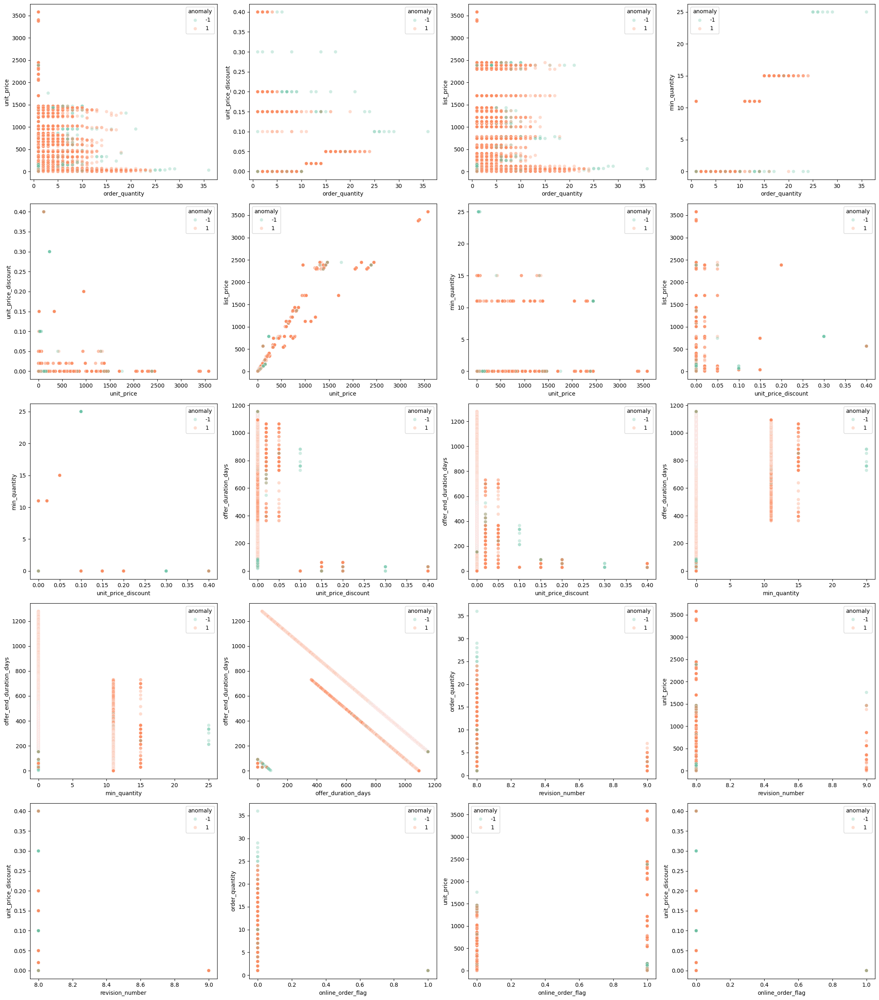

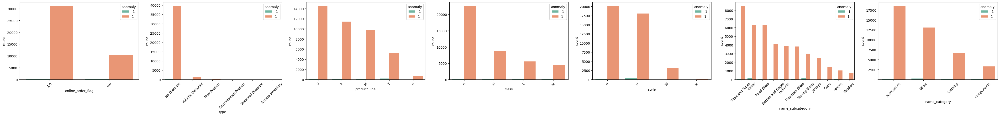

In [58]:
display_plots_for_analysis(prepare_x_for_analysis(anomalies))

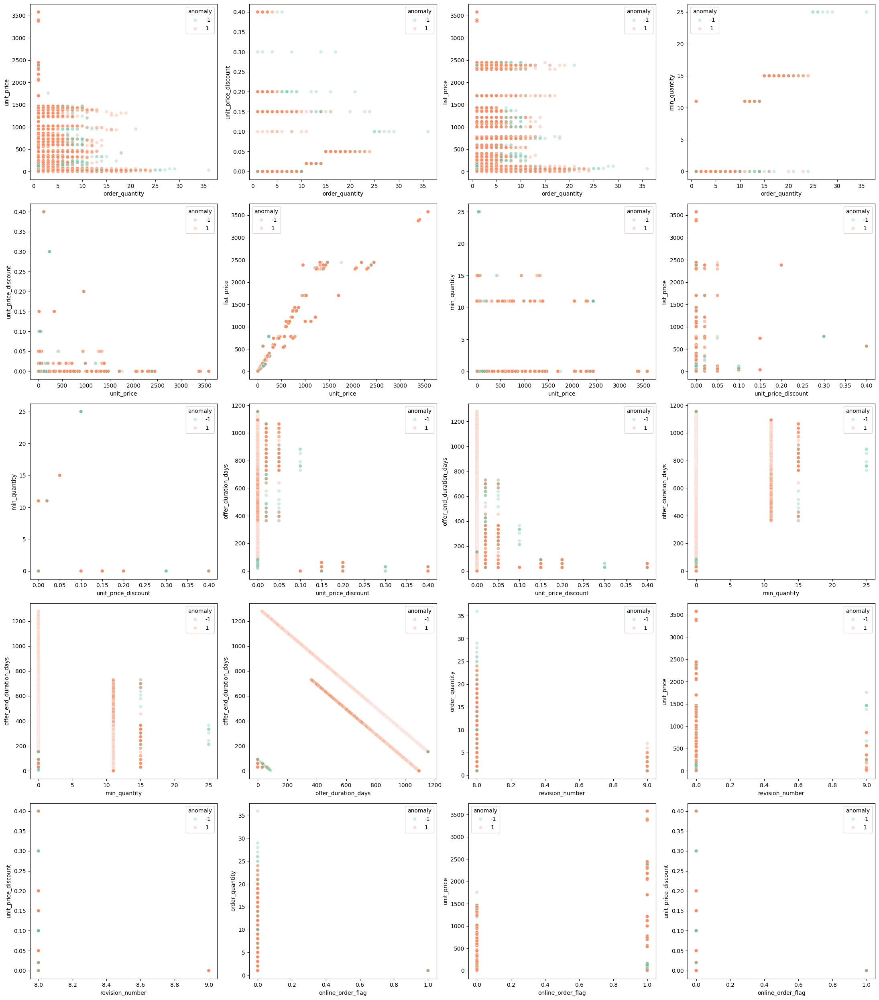

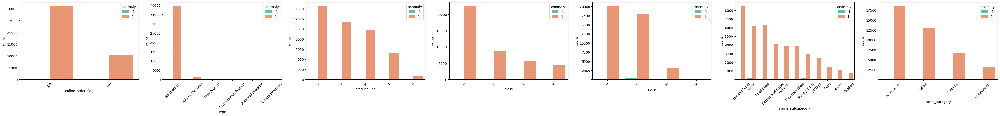

In [59]:
hyperparameters_lof1 = {
    "n_neighbors": 20,
    "metric": "manhattan",
    "n_jobs": -1
}
lof1 = LocalOutlierFactor(**hyperparameters_lof1)
anomalies_lof1 = lof1.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_lof1))

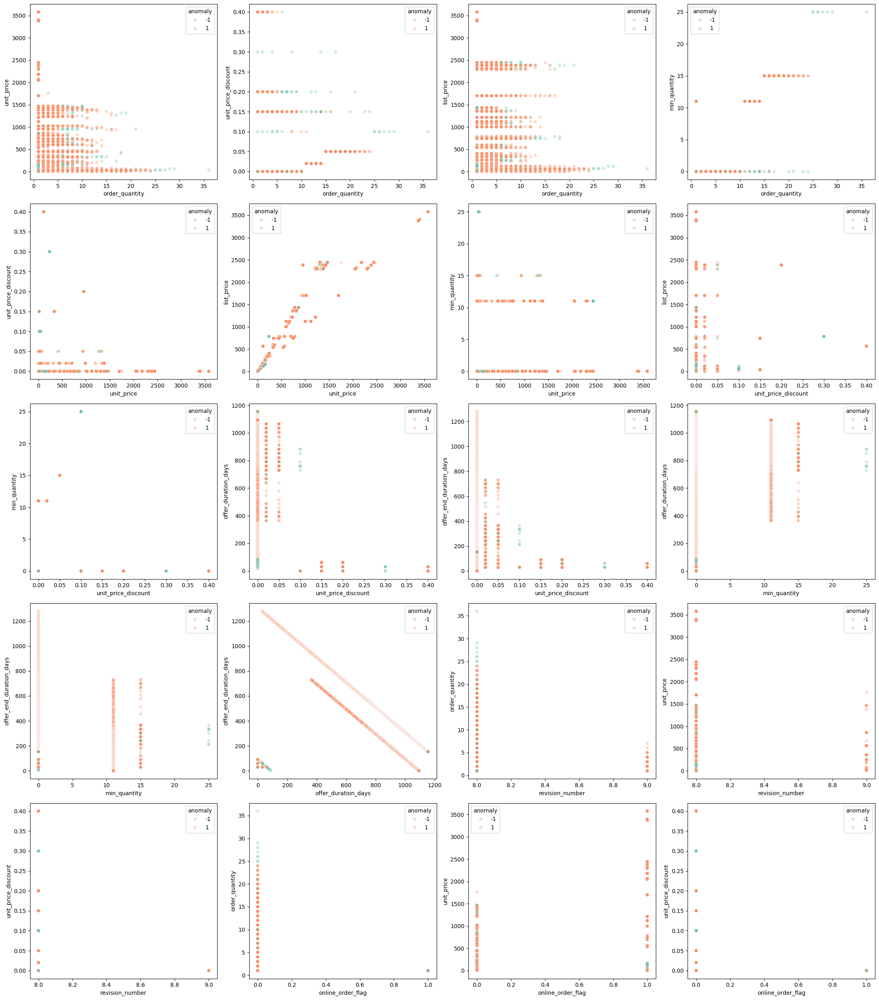

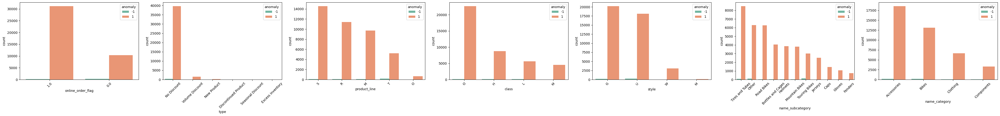

In [60]:
hyperparameters_lof2 = {
    "n_neighbors": 30,
    "metric": "euclidean",
    "n_jobs": -1
}
lof2 = LocalOutlierFactor(**hyperparameters_lof2)
anomalies_lof2 = lof2.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_lof2))

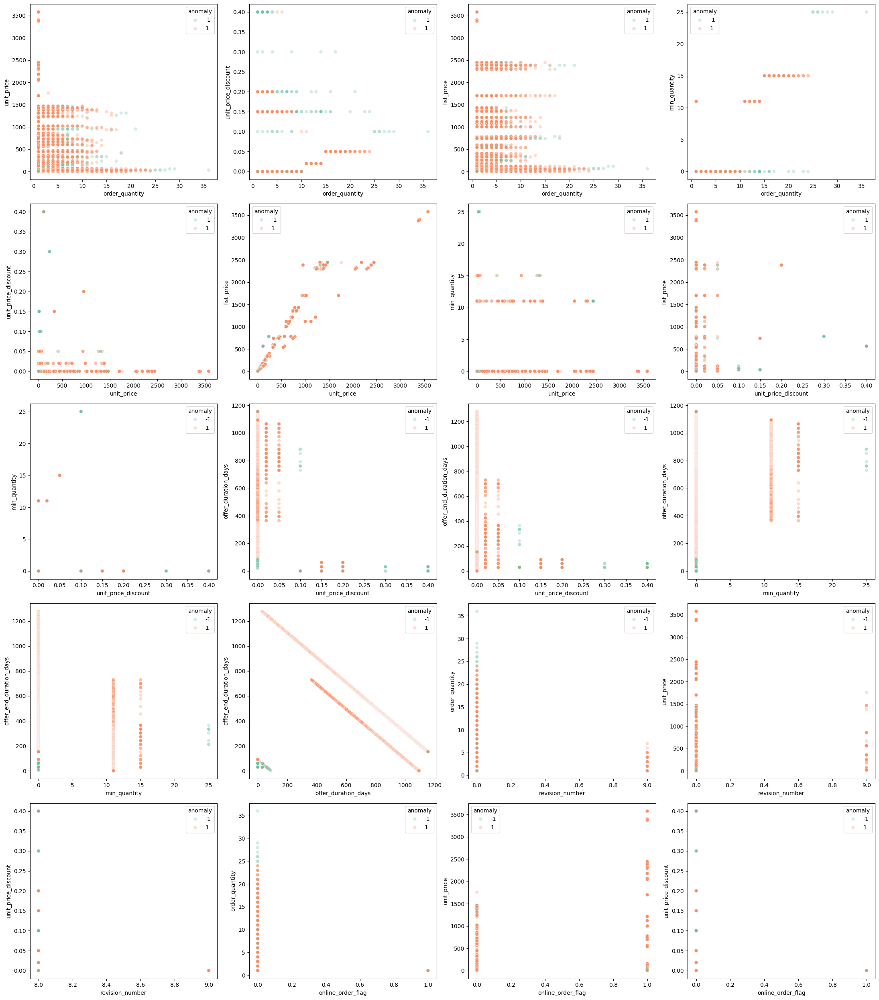

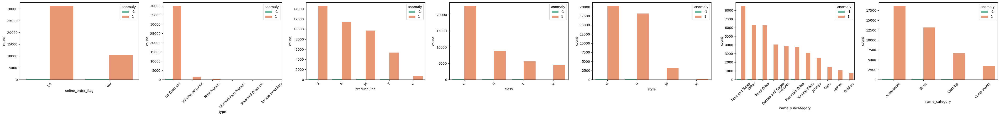

In [61]:
hyperparameters_lof3 = {
    "n_neighbors": 40,
    "metric": "euclidean",
    "n_jobs": -1
}
lof3 = LocalOutlierFactor(**hyperparameters_lof3)
anomalies_lof3 = lof3.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_lof3))

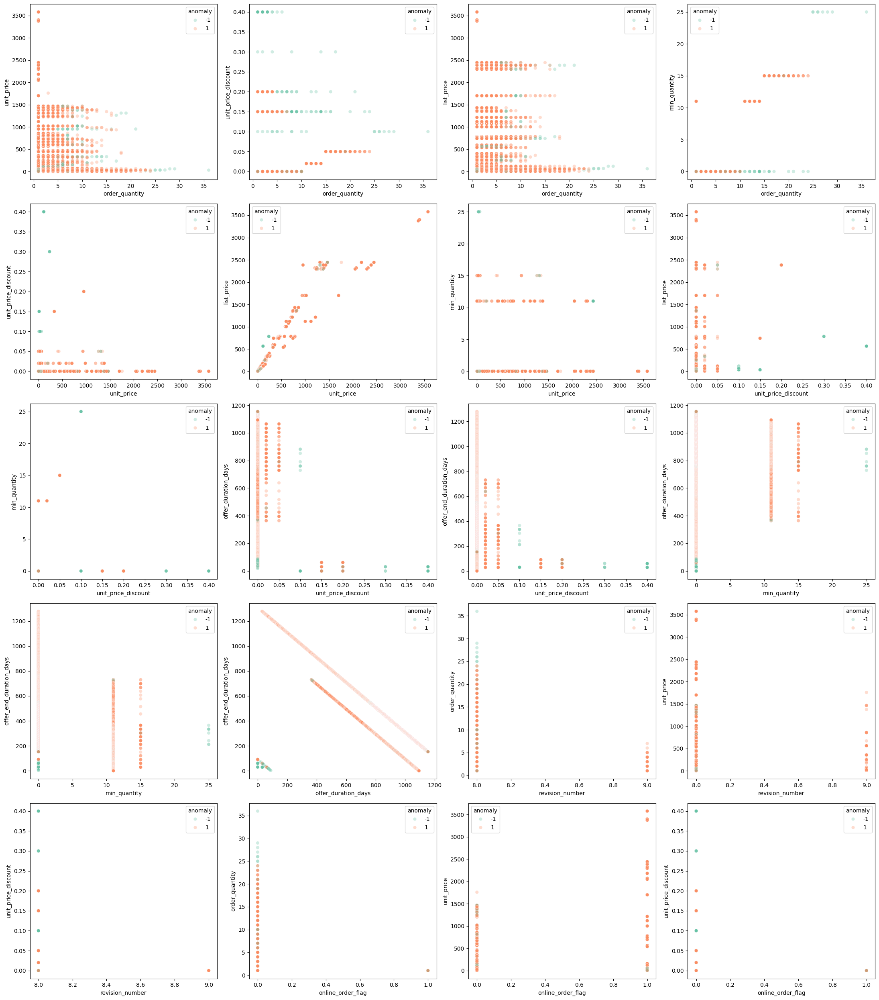

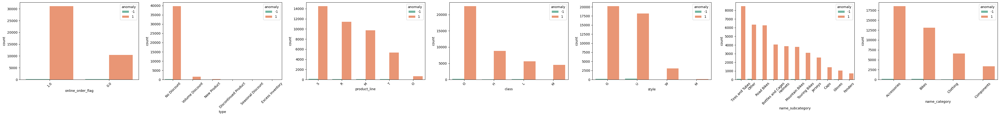

In [62]:
hyperparameters_lof4 = {
    "n_neighbors": 50,
    "metric": "euclidean",
    "n_jobs": -1
}
lof4 = LocalOutlierFactor(**hyperparameters_lof4)
anomalies_lof4 = lof4.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_lof4))

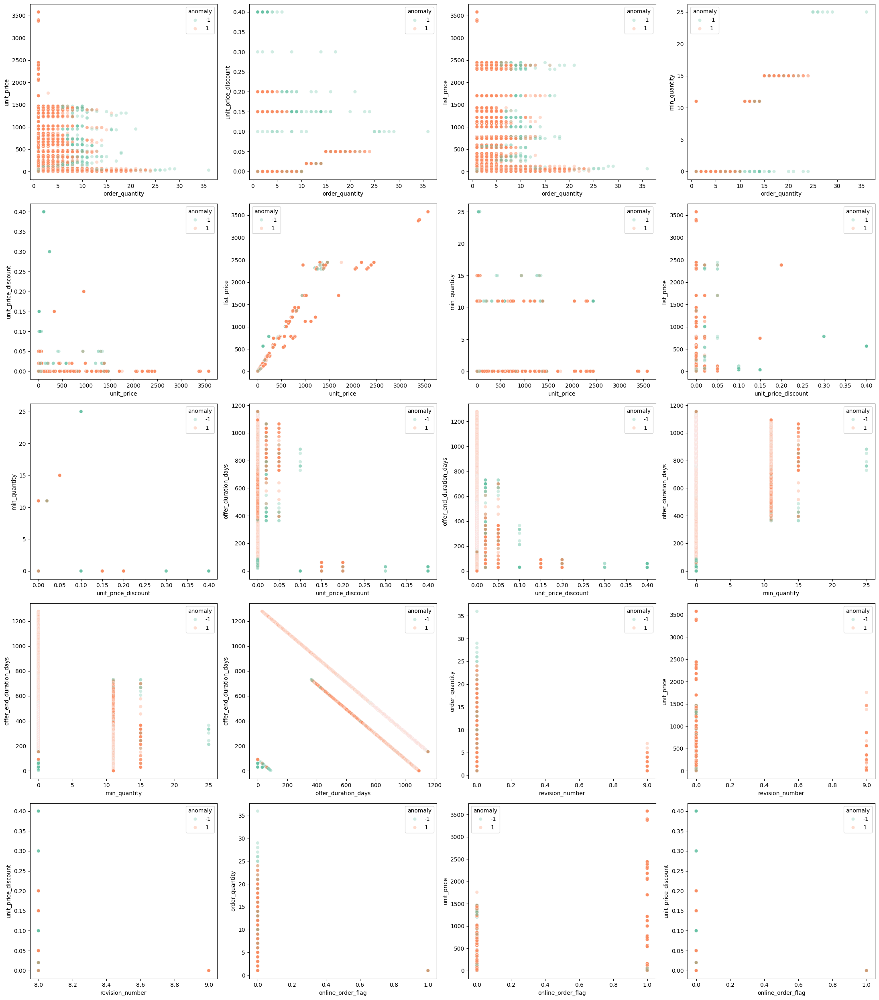

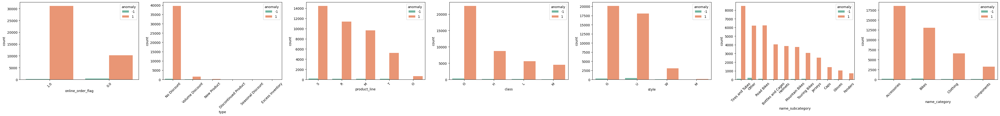

In [63]:
hyperparameters_lof5 = {
    "n_neighbors": 50,
    "metric": "manhattan",
    "n_jobs": -1
}
lof5 = LocalOutlierFactor(**hyperparameters_lof5)
anomalies_lof5 = lof5.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_lof5))

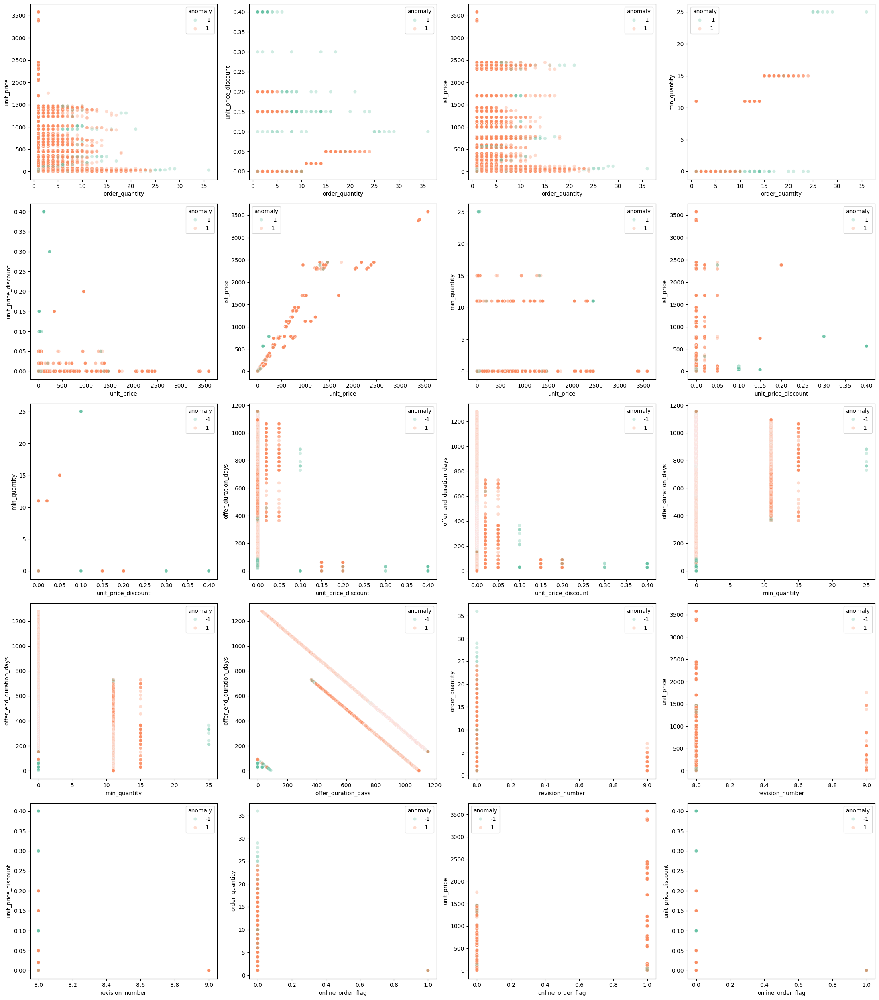

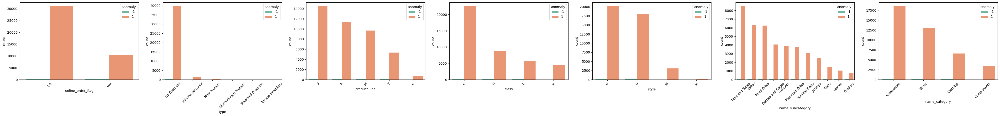

In [64]:
hyperparameters_lof6 = {
    "n_neighbors": 60,
    "metric": "euclidean",
    "n_jobs": -1
}
lof6 = LocalOutlierFactor(**hyperparameters_lof6)
anomalies_lof6 = lof6.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_lof6))

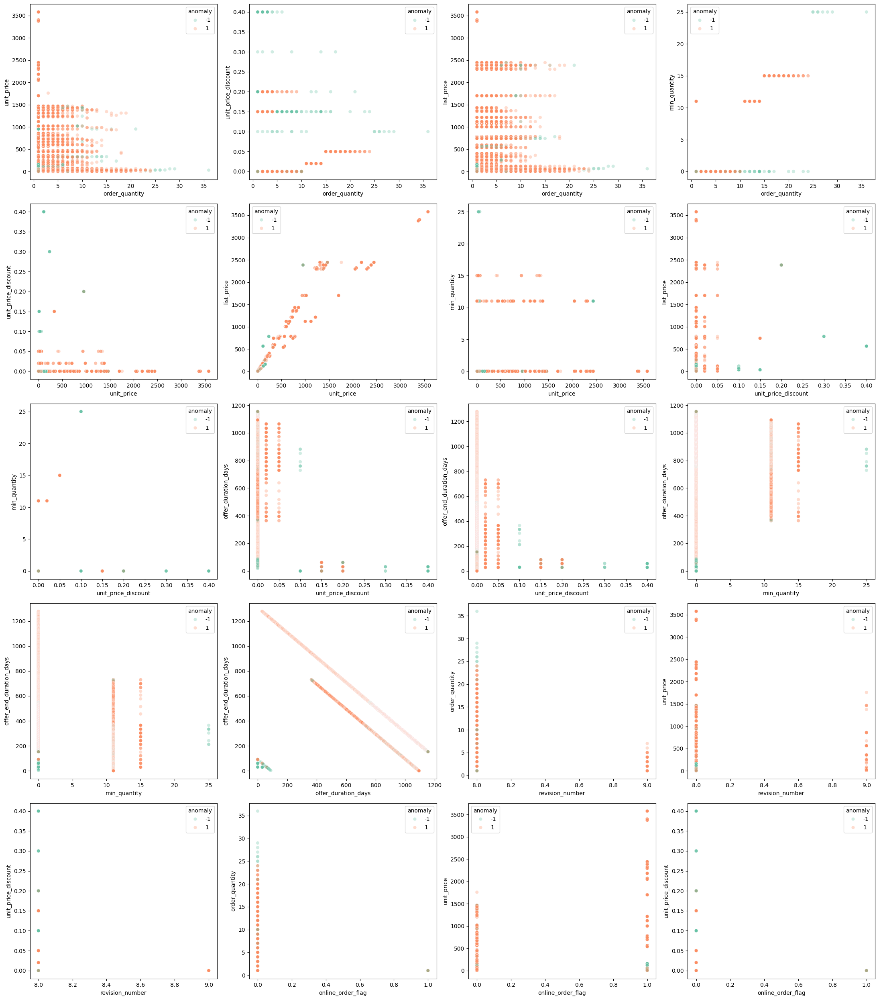

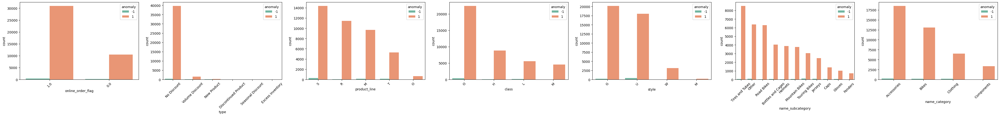

In [65]:
hyperparameters_lof7 = {
    "n_neighbors": 100,
    "metric": "euclidean",
    "n_jobs": -1
}
lof7 = LocalOutlierFactor(**hyperparameters_lof7)
anomalies_lof7 = lof7.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_lof7))

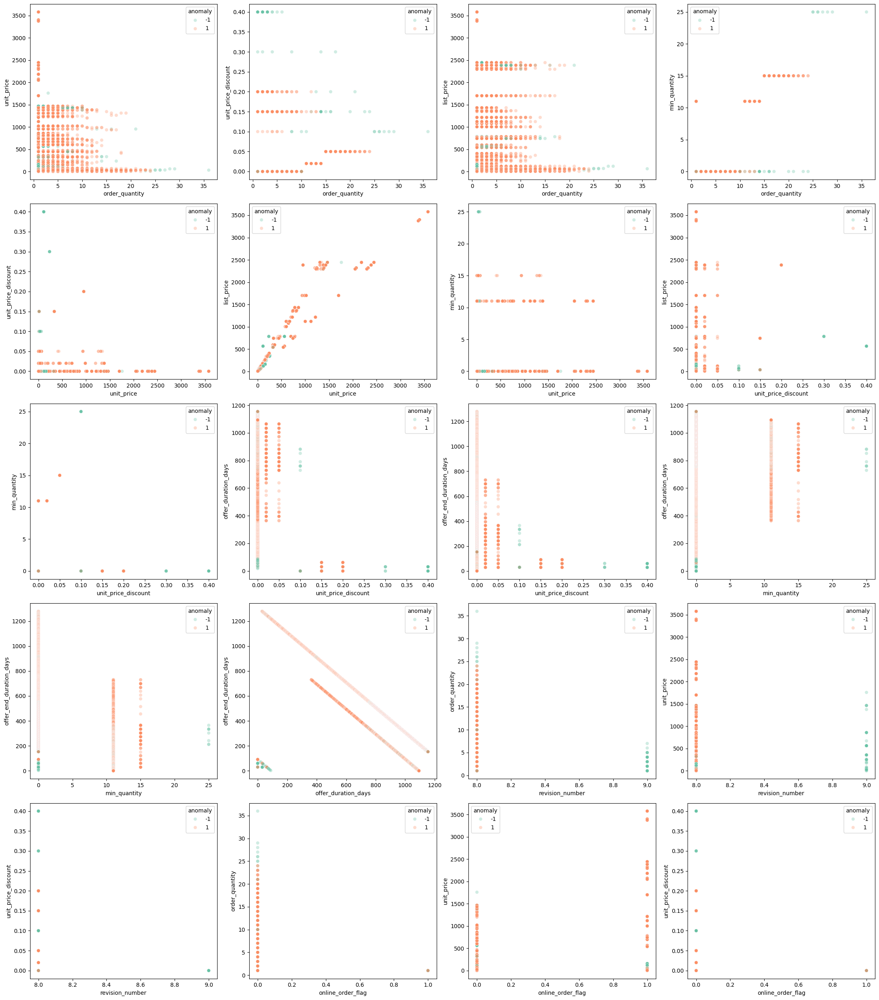

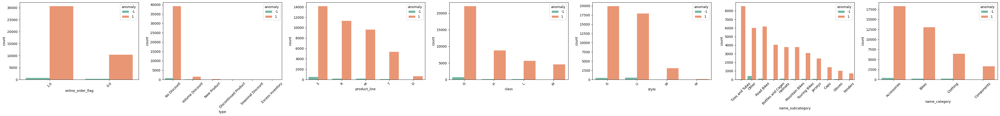

In [66]:
hyperparameters_lof8 = {
    "n_neighbors": 200,
    "metric": "euclidean",
    "n_jobs": -1
}
lof8 = LocalOutlierFactor(**hyperparameters_lof8)
anomalies_lof8 = lof8.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_lof8))

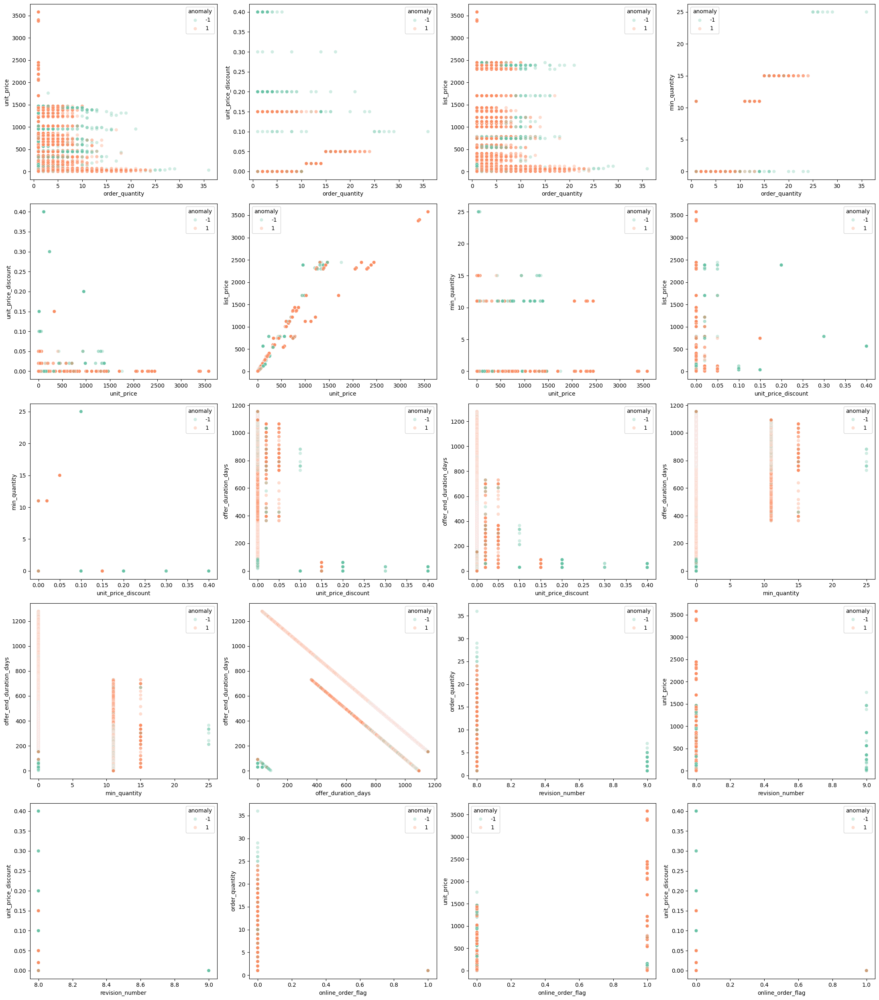

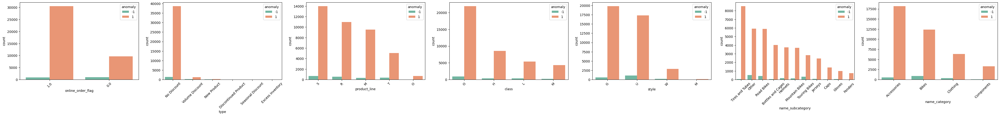

In [67]:
hyperparameters_lof9 = {
    "n_neighbors": 200,
    "metric": "manhattan",
    "n_jobs": -1
}
lof9 = LocalOutlierFactor(**hyperparameters_lof9)
anomalies_lof9 = lof9.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_lof9))

In [68]:
# Load sales metadata
sales_order_header_df = pd.read_csv(at.folder_path / "sales_order_header.csv")
sales_order_header_df.drop_duplicates(inplace=True)
sales_order_detail_df = pd.read_csv(at.folder_path / "sales_order_detail.csv")
sales_order_detail_df.drop_duplicates(inplace=True)
customer_df = pd.read_csv(at.folder_path / "customer.csv")
customer_df.drop_duplicates(inplace=True)
sales_territory_df = pd.read_csv(at.folder_path / "sales_territory.csv")
sales_territory_df.drop_duplicates(inplace=True)
product_df = pd.read_csv(at.folder_path / "product.csv")
product_df.drop_duplicates(inplace=True)

In [69]:
merged_sales_df = pd.merge(sales_order_detail_df, sales_order_header_df, on='sales_order_id', how='left')
merged_sales_df = pd.merge(merged_sales_df, product_df, on='product_id', how='left', suffixes=('', '_product'))

# Similar steps done as in the preperation notebook to get the same index values

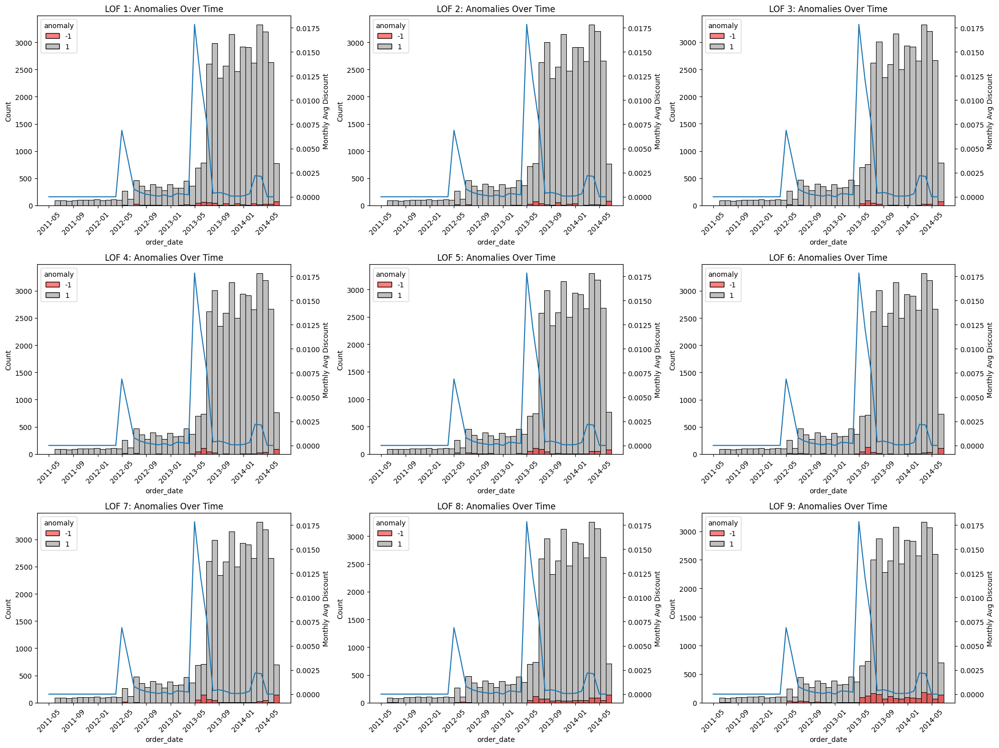

,model,anomaly_count,customer_id_anomaly_unique,customer_id_only_in_anomalies,product_id_anomaly_unique,product_id_only_in_anomalies,territory_id_anomaly_unique,territory_id_only_in_anomalies,person_id_anomaly_unique,person_id_only_in_anomalies,store_id_anomaly_unique,store_id_only_in_anomalies
0,LOF 1,606,255,5,136,1,4,0,255,5,71,0
1,LOF 2,483,235,7,112,0,4,0,235,7,60,0
2,LOF 3,385,219,6,94,0,4,0,219,6,45,0
3,LOF 4,453,252,8,97,0,4,0,252,8,46,0
4,LOF 5,685,273,8,133,0,4,0,273,8,66,0
5,LOF 6,499,293,14,92,0,4,0,293,14,44,0
6,LOF 7,621,410,27,81,0,4,0,410,27,52,0
7,LOF 8,985,695,21,111,1,4,0,695,21,56,0
8,LOF 9,1872,885,26,140,1,4,0,885,26,102,1


,model,normal_count,anomaly_count,anomaly_rate_%,avg_normal_lof_score,avg_anomaly_lof_score,strongest_anomaly_score,weakest_anomaly_score
0,LOF 1,41494,606,1.44,-1.0310,-1.724884e+08,-1.474435e+09,-1.5018
1,LOF 2,41617,483,1.15,-1.0280,-1.536934e+08,-1.390652e+09,-1.5007
2,LOF 3,41715,385,0.91,-1.0281,-2.275500e+00,-1.176790e+01,-1.5004
3,LOF 4,41647,453,1.08,-1.0288,-2.411500e+00,-1.227540e+01,-1.5001
4,LOF 5,41415,685,1.63,-1.0299,-3.401700e+00,-6.209070e+01,-1.5006
5,LOF 6,41601,499,1.19,-1.0302,-2.319500e+00,-1.244860e+01,-1.5001
6,LOF 7,41479,621,1.48,-1.0345,-2.206800e+00,-1.133480e+01,-1.5001
7,LOF 8,41115,985,2.34,-1.0368,-3.218300e+00,-1.050260e+01,-1.5008
8,LOF 9,40228,1872,4.45,-1.0394,-3.253600e+00,-1.885350e+01,-1.5006


In [77]:
fig, axes = plt.subplots(3, 3, figsize=(20, 15))
axes = axes.flatten()

lof_anomaly_sets = [
    anomalies_lof1, anomalies_lof2, anomalies_lof3,
    anomalies_lof4, anomalies_lof5, anomalies_lof6,
    anomalies_lof7, anomalies_lof8, anomalies_lof9
]

lof_score_sets = [
    lof1.negative_outlier_factor_,
    lof2.negative_outlier_factor_,
    lof3.negative_outlier_factor_,
    lof4.negative_outlier_factor_,
    lof5.negative_outlier_factor_,
    lof6.negative_outlier_factor_,
    lof7.negative_outlier_factor_,
    lof8.negative_outlier_factor_,
    lof9.negative_outlier_factor_
]

id_summary_rows = []
lof_score_rows = []

for i, (anomalies, lof_scores) in enumerate(zip(lof_anomaly_sets, lof_score_sets)):
    X = prepare_x_for_analysis(anomalies).copy()

    X['lof_score'] = lof_scores

    row_positions = X.index

    X['customer_id'] = merged_sales_df.iloc[row_positions]['customer_id'].values
    X['territory_id'] = merged_sales_df.iloc[row_positions]['territory_id'].values
    X['product_id'] = merged_sales_df.iloc[row_positions]['product_id'].values
    X['sales_order_id'] = merged_sales_df.iloc[row_positions]['sales_order_id'].values

    X['order_date'] = pd.to_datetime(
        merged_sales_df.iloc[row_positions]['order_date'].values
    )

    X['source_row_position'] = row_positions

    X = X.merge(
        customer_df[['customer_id', 'person_id', 'store_id']],
        on='customer_id',
        how='left'
    )

    X['order_month'] = X['order_date'].dt.to_period('M').dt.to_timestamp()

    monthly_discount = (
        X.groupby('order_month')
        .agg(avg_discount=('unit_price_discount', 'mean'))
        .reset_index()
    )

    normal_data = X[X['anomaly'] == 1]
    abnormal_data = X[X['anomaly'] == -1]

    def id_summary(col):
        normal_ids = set(normal_data[col].dropna())
        anomaly_ids = set(abnormal_data[col].dropna())

        return {
            f'{col}_anomaly_unique': len(anomaly_ids),
            f'{col}_only_in_anomalies': len(anomaly_ids - normal_ids)
        }

    id_row = {
        'model': f'LOF {i + 1}',
        'anomaly_count': len(abnormal_data)
    }

    for col in ['customer_id', 'product_id', 'territory_id', 'person_id', 'store_id']:
        id_row.update(id_summary(col))

    id_summary_rows.append(id_row)


    lof_row = {
        'model': f'LOF {i + 1}',
        'normal_count': len(normal_data),
        'anomaly_count': len(abnormal_data),
        'anomaly_rate_%': round((len(abnormal_data) / len(X)) * 100, 2),
        'avg_normal_lof_score': round(normal_data['lof_score'].mean(), 4),
        'avg_anomaly_lof_score': round(abnormal_data['lof_score'].mean(), 4),
        'strongest_anomaly_score': round(abnormal_data['lof_score'].min(), 4),
        'weakest_anomaly_score': round(abnormal_data['lof_score'].max(), 4)
    }

    lof_score_rows.append(lof_row)

    sns.histplot(
        data=X,
        x='order_date',
        hue='anomaly',
        bins=40,
        palette={1: 'grey', -1: 'red'},
        ax=axes[i]
    )

    axes[i].set_title(f'LOF {i + 1}: Anomalies Over Time')
    axes[i].tick_params(axis='x', rotation=45)

    ax2 = axes[i].twinx()

    sns.lineplot(
        data=monthly_discount,
        x='order_month',
        y='avg_discount',
        ax=ax2
    )

    ax2.set_ylabel('Monthly Avg Discount')

plt.tight_layout()
plt.show()

lof_id_summary_df = pd.DataFrame(id_summary_rows)
lof_score_summary_df = pd.DataFrame(lof_score_rows)

display(lof_id_summary_df)
display(lof_score_summary_df)

LOF 4 was selected as the final model because it provides the best balance between anomaly strength, interpretability and investigation practicality. Although LOF 5 produced a more negative average anomaly score, this does not automatically make it the better model. LOF 5 used Manhattan distance and flagged 685 anomalies, which is around 51% more than LOF 4. This suggests that it is more aggressive and may increase the investigation workload without necessarily improving business usefulness. In contrast, LOF 4 identified 453 anomalies, representing approximately 1.08% of the dataset, which is a focused and manageable anomaly rate for business review. Its average anomaly LOF score of -2.41 still shows clear separation from normal transactions, whose average score is close to -1.03. Therefore, LOF 4 captures meaningful local abnormality while avoiding excessive flagging. This makes it the most suitable model for identifying unusual sales behaviour related to quantity, discounting, pricing, offer duration and customer/store traceability.

In [132]:
X = prepare_x_for_analysis(anomalies_lof4)
row_positions = X.index
X['source_row_position'] = row_positions
X['customer_id'] = merged_sales_df.iloc[row_positions]['customer_id'].values
X['territory_id'] = merged_sales_df.iloc[row_positions]['territory_id'].values
X['product_id'] = merged_sales_df.iloc[row_positions]['product_id'].values
X['sales_order_id'] = merged_sales_df.iloc[row_positions]['sales_order_id'].values
X['order_date'] = pd.to_datetime(
    merged_sales_df.iloc[row_positions]['order_date'].values
)

X = X.merge(
    product_df[['product_id', 'name', 'reorder_point', 'safety_stock_level']],
    on='product_id',
    how='left'
)

X = X.merge(
    customer_df[['customer_id', 'person_id', 'store_id', 'account_number']],
    on='customer_id',
    how='left'
)

X = X.merge(
    sales_territory_df[['territory_id', 'name']],
    on='territory_id',
    how='left',
    suffixes=('', '_territory')
)

In [133]:
features_to_compare = [
    'order_quantity',
    'unit_price',
    'unit_price_discount',
    'min_quantity',
    'list_price',
    'offer_duration_days',
    'offer_end_duration_days'
]

summary = X.groupby('anomaly')[features_to_compare].agg(['mean', 'median', 'min', 'max'])
summary.T

anomaly                                  -1            1
order_quantity          mean       4.289183     1.668740
                        median     1.000000     1.000000
                        min        1.000000     1.000000
                        max       36.000000    24.000000
unit_price              mean     379.337239   527.817438
                        median    35.000000    34.990000
                        min        2.290000     1.328200
                        max     2443.350000  3578.270000
unit_price_discount     mean       0.059978     0.001392
                        median     0.000000     0.000000
                        min        0.000000     0.000000
                        max        0.400000     0.200000
min_quantity            mean       1.123620     0.432828
                        median     0.000000     0.000000
                        min        0.000000     0.000000
                        max       25.000000    15.000000
list_price              mean     571.225430   606.715593
                        median    35.000000    44.540000
                        min        2.290000     2.290000
                        max     2443.350000  3578.270000
offer_duration_days     mean     638.626932   888.262684
                        median   765.000000   930.000000
                        min       -1.000000    -1.000000
                        max     1155.000000  1155.000000
offer_end_duration_days mean     304.403974   403.662161
                        median   181.000000   366.000000
                        min        2.000000    -0.000000
                        max      914.000000  1279.000000

In [134]:
display(X[X['order_quantity'] > 24].groupby(['name_territory', 'type', 'order_date', 'min_quantity', 'name_subcategory'])['anomaly'].value_counts())
display(X[X['min_quantity'] == 25]['anomaly'].value_counts())
filtered_X = X[X['order_quantity'] <= 24]

name_territory  type             order_date           min_quantity  name_subcategory  anomaly
France          Volume Discount  2013-06-29 22:00:00  25.0          Vests             -1         1
                                 2013-07-30 22:00:00  25.0          Bike Racks        -1         1
Germany         Volume Discount  2013-05-29 22:00:00  25.0          Vests             -1         1
                                 2013-06-29 22:00:00  25.0          Bike Racks        -1         1
                                                                    Vests             -1         1
United Kingdom  Volume Discount  2013-09-29 22:00:00  25.0          Shorts            -1         1
                                 2013-10-29 23:00:00  25.0          Shorts            -1         2
Name: count, dtype: int64

,count
anomaly,
-1,8


In [135]:
display(filtered_X[(filtered_X['order_quantity'] > 10) & (X['min_quantity'] == 0)].groupby(['name_territory', 'type', 'order_date',
                                                                                            'name_subcategory', 'person_id', 'customer_id',
                                                                                            'account_number', 'offer_duration_days']
                                                                                           )['anomaly'].value_counts())
display(filtered_X[(filtered_X['order_quantity'] > 10) & (X['min_quantity'] == 0)]['customer_id'].value_counts())
filtered_X = filtered_X[~((filtered_X['order_quantity'] > 10) & (filtered_X['min_quantity'] == 0))]

name_territory  type               order_date           name_subcategory  person_id                             customer_id                           account_number  offer_duration_days  anomaly
Australia       New Product        2013-06-29 22:00:00  Touring Bikes     385e2872-c7fc-4e51-9e2f-11f54dce624b  b5593754-84f3-4a66-bd84-94812738ed4c  AW00029706       30.0                -1         1
France          Excess Inventory   2012-06-29 22:00:00  Road Bikes        dd283114-5e48-4281-a12e-ff1988ee6094  7b039bd4-ac81-4736-9784-2a247cd38199  AW00030103       30.0                -1         1
                New Product        2013-06-29 22:00:00  Touring Bikes     5deee7fd-7c01-4a10-96e8-730045607697  95e8432e-7012-4d48-a6c1-544b293d1dc9  AW00029940       30.0                -1         2
                Seasonal Discount  2012-05-29 22:00:00  Helmets           73ec98dc-8258-4e2e-a1b4-d22568285e3c  57f12e6d-4253-4c51-b07c-1b4b19c97920  AW00029795      -1.0                 -1         1
                                   2013-05-29 22:00:00  Helmets           73ec98dc-8258-4e2e-a1b4-d22568285e3c  57f12e6d-4253-4c51-b07c-1b4b19c97920  AW00029795      -1.0                 -1         2
Germany         New Product        2013-05-29 22:00:00  Touring Bikes     8efaba28-d48f-4200-924c-1c82480ea33e  9e0323bf-9d1c-43bc-ac7c-81b7707d0d4b  AW00029693      -1.0                 -1         1
                                                                          fbf221cb-382c-4f57-bb34-8952d8e834fd  84c09615-4ed6-4e20-9c62-c478ffb74b4c  AW00029589      -1.0                 -1         1
                                   2013-06-29 22:00:00  Touring Bikes     703ffd81-d6d6-4889-994a-32b2f9ed2b96  815ca845-54ad-4993-b5fb-6e31579002e7  AW00029609       30.0                -1         1
                                                                          ca733e50-7dc4-4d2e-9378-dd5cd77310f6  d2979a03-0123-4808-b627-748289863876  AW00029995       30.0                -1         1
                Seasonal Discount  2013-05-29 22:00:00  Helmets           8efaba28-d48f-4200-924c-1c82480ea33e  9e0323bf-9d1c-43bc-ac7c-81b7707d0d4b  AW00029693      -1.0                 -1         2
                                                                          fbf221cb-382c-4f57-bb34-8952d8e834fd  84c09615-4ed6-4e20-9c62-c478ffb74b4c  AW00029589      -1.0                 -1         1
United Kingdom  Excess Inventory   2012-05-29 22:00:00  Road Bikes        7b542773-3bdd-4b24-a4df-3abf9a3d5fad  ba676985-8254-40df-9724-0668c7e1a29a  AW00029587      -1.0                 -1         1
                New Product        2013-06-29 22:00:00  Touring Bikes     a8357a1f-b612-4fbe-b593-e9dd8ace3369  44c39c5a-c54a-420c-af82-dce378094423  AW00029615       30.0                -1         1
                                   2013-07-30 22:00:00  Touring Bikes     fe8e899f-9617-46ab-b232-95fbdc5d88bf  a10fe786-6908-4fb3-8c90-89aaff0b37e0  AW00029736       61.0                -1         3
                Seasonal Discount  2013-05-29 22:00:00  Helmets           7672c7ac-9710-428d-ba23-468d70d81981  19c97654-2a66-4d95-b4b4-dafe62bf0a3c  AW00029941      -1.0                 -1         2
                                                                          7b542773-3bdd-4b24-a4df-3abf9a3d5fad  ba676985-8254-40df-9724-0668c7e1a29a  AW00029587      -1.0                 -1         3
Name: count, dtype: int64

,count
customer_id,
ba676985-8254-40df-9724-0668c7e1a29a,4
57f12e6d-4253-4c51-b07c-1b4b19c97920,3
9e0323bf-9d1c-43bc-ac7c-81b7707d0d4b,3
a10fe786-6908-4fb3-8c90-89aaff0b37e0,3
95e8432e-7012-4d48-a6c1-544b293d1dc9,2
19c97654-2a66-4d95-b4b4-dafe62bf0a3c,2
84c09615-4ed6-4e20-9c62-c478ffb74b4c,2
7b039bd4-ac81-4736-9784-2a247cd38199,1
b5593754-84f3-4a66-bd84-94812738ed4c,1


In [136]:
display(filtered_X[filtered_X['unit_price_discount'].isin([0.3, 0.4])].groupby(
    ['name_territory', 'type', 'unit_price_discount', 'name', 'order_quantity', 'person_id', 'customer_id', 'account_number'],
    dropna=False)['anomaly'].value_counts(dropna=False))
filtered_X = filtered_X[~filtered_X['unit_price_discount'].isin([0.3, 0.4])]

name_territory  type                  unit_price_discount  name                     order_quantity  person_id                             customer_id                           account_number  anomaly
Australia       Discontinued Product  0.4                  Mountain-500 Silver, 52  1.0             797d412d-e9f0-4234-b50a-db477ed8b81e  f2107e85-69ca-42c0-a49b-af0cdc7f40aa  AW00029960      -1         1
                                                                                    3.0             3c7ce0d0-7244-4bb5-a587-b2a57ce832d0  a05d14f4-be47-4f66-8b5f-c07f5c4ad3da  AW00029628      -1         1
France          Discontinued Product  0.4                  Mountain-500 Silver, 42  2.0             87b13cb1-275a-4388-a5ca-116ce7f37eea  f0a63726-5609-4739-a73e-02f2870c3cf9  AW00029786      -1         1
                                                                                    4.0             2ae0f757-8f82-4769-9c35-4447d8d47590  26c12931-987f-41d8-a85b-d6961b4b3ebe  AW00030101      -1         1
                                                           Mountain-500 Silver, 52  1.0             2ae0f757-8f82-4769-9c35-4447d8d47590  26c12931-987f-41d8-a85b-d6961b4b3ebe  AW00030101      -1         1
                                                                                    2.0             46f401e2-9fc5-4712-8726-dae298c2a1d8  cf7ecb8f-2a6a-42a1-bc10-4ddebb6a7db7  AW00029712      -1         1
                                                                                                    87b13cb1-275a-4388-a5ca-116ce7f37eea  f0a63726-5609-4739-a73e-02f2870c3cf9  AW00029786      -1         1
                                                           NaN                      1.0             2ae0f757-8f82-4769-9c35-4447d8d47590  26c12931-987f-41d8-a85b-d6961b4b3ebe  AW00030101      -1         1
                                                                                    3.0             87b13cb1-275a-4388-a5ca-116ce7f37eea  f0a63726-5609-4739-a73e-02f2870c3cf9  AW00029786      -1         1
                Excess Inventory      0.3                  Road-650 Red, 44         4.0             3b3a6042-4096-41da-90e3-48fde51fdfc5  e24396e0-13ed-4817-ae2e-421feee1e059  AW00030026      -1         1
                                                                                    8.0             73ec98dc-8258-4e2e-a1b4-d22568285e3c  57f12e6d-4253-4c51-b07c-1b4b19c97920  AW00029795      -1         1
Germany         Discontinued Product  0.4                  Mountain-500 Silver, 42  1.0             d2309d9b-a7c7-4129-9e52-76e47d13708b  f5817ab0-381a-4763-bb84-6795cbbc4025  AW00029542      -1         1
                                                                                    2.0             b9dab918-444a-4281-b87a-b843d7bf3873  57f9580e-23d7-44a6-8150-3d63e012af12  AW00029725      -1         1
                                                                                    3.0             0ba84a54-40fd-456e-b1f6-a14a8c009327  9c581176-3c50-4372-b110-faa57f08a704  AW00029552      -1         1
                                                           Mountain-500 Silver, 44  1.0             b9dab918-444a-4281-b87a-b843d7bf3873  57f9580e-23d7-44a6-8150-3d63e012af12  AW00029725      -1         1
                                                                                    2.0             0ba84a54-40fd-456e-b1f6-a14a8c009327  9c581176-3c50-4372-b110-faa57f08a704  AW00029552      -1         1
                                                           Mountain-500 Silver, 52  2.0             b9dab918-444a-4281-b87a-b843d7bf3873  57f9580e-23d7-44a6-8150-3d63e012af12  AW00029725      -1         1
                                                           NaN                      3.0             b9dab918-444a-4281-b87a-b843d7bf3873  57f9580e-23d7-44a6-8150-3d63e012af12  AW00029725      -1         1
United Kingdom  Discontinued Product  0.4                  Mountain-500 Silver, 40  1.0             7132247c-0

In [137]:
display(filtered_X[filtered_X['unit_price_discount'] == 0.1].groupby(['name_territory', 'type', 'name_subcategory', 'name', 'person_id',
                                                              'customer_id', 'account_number'], dropna=False)['anomaly'].value_counts(dropna=False))
display(filtered_X[filtered_X['type'] == 'Seasonal Discount']['anomaly'].value_counts())
filtered_X = filtered_X[~(filtered_X['type'] == 'Seasonal Discount')]

name_territory  type               name_subcategory  name                     person_id                             customer_id                           account_number  anomaly
France          Seasonal Discount  Helmets           Sport-100 Helmet, Black  3665be6c-3512-4f0f-bb21-61d7134b6083  331d9dbf-7d13-4be3-9bed-663b81b3c765  AW00029909      -1         1
                                                                              b05b158d-5a29-42a5-b38e-105e96491fe5  4851cf1d-f342-4173-97c1-40c39f49a214  AW00029613      -1         1
                                                     Sport-100 Helmet, Red    3665be6c-3512-4f0f-bb21-61d7134b6083  331d9dbf-7d13-4be3-9bed-663b81b3c765  AW00029909      -1         1
                                                                              73ec98dc-8258-4e2e-a1b4-d22568285e3c  57f12e6d-4253-4c51-b07c-1b4b19c97920  AW00029795      -1         1
                                                                              b05b158d-5a29-42a5-b38e-105e96491fe5  4851cf1d-f342-4173-97c1-40c39f49a214  AW00029613      -1         1
                                                     NaN                      3665be6c-3512-4f0f-bb21-61d7134b6083  331d9dbf-7d13-4be3-9bed-663b81b3c765  AW00029909      -1         1
                                                                              73ec98dc-8258-4e2e-a1b4-d22568285e3c  57f12e6d-4253-4c51-b07c-1b4b19c97920  AW00029795      -1         1
                                                                              b05b158d-5a29-42a5-b38e-105e96491fe5  4851cf1d-f342-4173-97c1-40c39f49a214  AW00029613      -1         1
United Kingdom  Seasonal Discount  Helmets           Sport-100 Helmet, Black  7b542773-3bdd-4b24-a4df-3abf9a3d5fad  ba676985-8254-40df-9724-0668c7e1a29a  AW00029587      -1         1
                                                     Sport-100 Helmet, Red    7b542773-3bdd-4b24-a4df-3abf9a3d5fad  ba676985-8254-40df-9724-0668c7e1a29a  AW00029587      -1         1
                                                     NaN                      7b542773-3bdd-4b24-a4df-3abf9a3d5fad  ba676985-8254-40df-9724-0668c7e1a29a  AW00029587      -1         1
Name: count, dtype: int64

,count
anomaly,
-1,21


In [141]:
display(filtered_X[(filtered_X['offer_end_duration_days'] < 60) & (filtered_X['offer_duration_days'] < 60)].groupby([
    'name_territory', 'order_date', 'person_id', 'name', 'type', 'name_subcategory'], dropna=False)['anomaly'].value_counts())
filtered_X = filtered_X[~((filtered_X['offer_end_duration_days'] < 60) & (filtered_X['offer_duration_days'] < 60))]

name_territory  order_date           person_id                             name                     type         name_subcategory  anomaly
France          2013-07-02 22:00:00  e8109de2-ada1-4056-9ab1-d24a0507b2a7  NaN                      New Product  Touring Bikes     -1         1
                2013-07-05 22:00:00  ef315839-838d-4c01-8f58-680b18babd8b  Touring-3000 Blue, 50    New Product  Touring Bikes     -1         1
                2013-07-06 22:00:00  f580b156-a50f-4fc6-9f1b-b628ba53ce0f  NaN                      New Product  Touring Bikes     -1         1
                2013-07-24 22:00:00  e2c5d2cc-d7c3-41ca-97af-c8cd5681ddcd  Touring-3000 Yellow, 44  New Product  Touring Bikes     -1         1
Germany         2013-07-22 22:00:00  13d3ece9-c5b4-4d18-a0ee-1f6aa4aa7852  Touring-3000 Yellow, 54  New Product  Touring Bikes     -1         1
                                     aea7a2ee-291f-45e4-9406-96094caa6508  NaN                      New Product  Touring Bikes     -1         1
Name: count, dtype: int64

In [144]:
features_to_compare = [
    'order_quantity',
    'unit_price',
    'unit_price_discount',
    'min_quantity',
    'list_price',
    'offer_duration_days',
    'offer_end_duration_days'
]

summary = filtered_X[filtered_X['type'] == 'New Product'].groupby('anomaly')[features_to_compare].agg(['mean', 'median', 'min', 'max'])
display(summary.T)
filtered_X = filtered_X[filtered_X['type'] != 'New Product']

anomaly                                  -1            1
order_quantity          mean       5.974359     2.313653
                        median     7.000000     2.000000
                        min        1.000000     1.000000
                        max       10.000000     7.000000
unit_price              mean     829.539346   516.956541
                        median   742.350000   334.057500
                        min      334.057500   334.057500
                        max     2384.070000   953.628000
unit_price_discount     mean       0.129487     0.164760
                        median     0.150000     0.150000
                        min        0.000000     0.150000
                        max        0.200000     0.200000
min_quantity            mean       0.000000     0.000000
                        median     0.000000     0.000000
                        min        0.000000     0.000000
                        max        0.000000     0.000000
list_price              mean    1500.066923  1226.990590
                        median   742.350000   742.350000
                        min      742.350000   742.350000
                        max     2384.070000  2384.070000
offer_duration_days     mean      39.589744    37.321033
                        median    30.000000    30.000000
                        min       -1.000000    -1.000000
                        max       88.000000    61.000000
offer_end_duration_days mean      50.410256    52.678967
                        median    60.000000    60.000000
                        min        2.000000    29.000000
                        max       91.000000    91.000000

In [145]:
filtered_X['price_gap'] = filtered_X['list_price'] - filtered_X['unit_price']
filtered_X['price_gap_pct'] = filtered_X['price_gap'] / filtered_X['list_price']

price_gap_analysis = filtered_X.groupby('anomaly')[['price_gap', 'price_gap_pct']].agg(
    ['mean', 'median', 'min', 'max']
)

price_gap_analysis

price_gap                        price_gap_pct                      
               mean median  min        max          mean median  min       max
anomaly                                                                       
-1       103.985931    0.0  0.0  1077.1382      0.108602    0.0  0.0  0.464286
 1        74.764411    0.0  0.0  1134.4125      0.104145    0.0  0.0  0.482143

<Axes: xlabel='order_quantity', ylabel='Percent'>

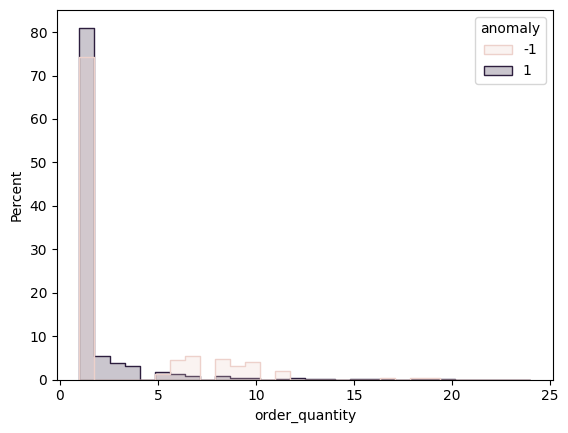

In [146]:
sns.histplot(
    data=filtered_X,
    x='order_quantity',
    hue='anomaly',
    bins=30,
    stat='percent',
    common_norm=False,
    element='step'
)

In [147]:
qty_6_10_all = filtered_X[
    filtered_X['order_quantity'].between(6, 10)
].copy()

display(
    qty_6_10_all
    .groupby('anomaly')
    .agg(
        count=('anomaly', 'count'),
        avg_discount=('unit_price_discount', 'mean'),
        max_discount=('unit_price_discount', 'max'),
        avg_unit_price=('unit_price', 'mean'),
        avg_list_price=('list_price', 'mean'),
        avg_min_quantity=('min_quantity', 'mean'),
        avg_offer_duration=('offer_duration_days', 'mean'),
        avg_offer_end_duration=('offer_end_duration_days', 'mean')
    )
)

,count,avg_discount,max_discount,avg_unit_price,avg_list_price,avg_min_quantity,avg_offer_duration,avg_offer_end_duration
anomaly,,,,,,,,
-1,69,0.0,0.0,565.147125,966.510870,0.0,807.086957,500.913043
1,1475,0.0,0.0,237.616014,401.682946,0.0,835.218983,472.781017


In [153]:
filtered_X = filtered_X[~filtered_X['order_quantity'].between(6, 10)]

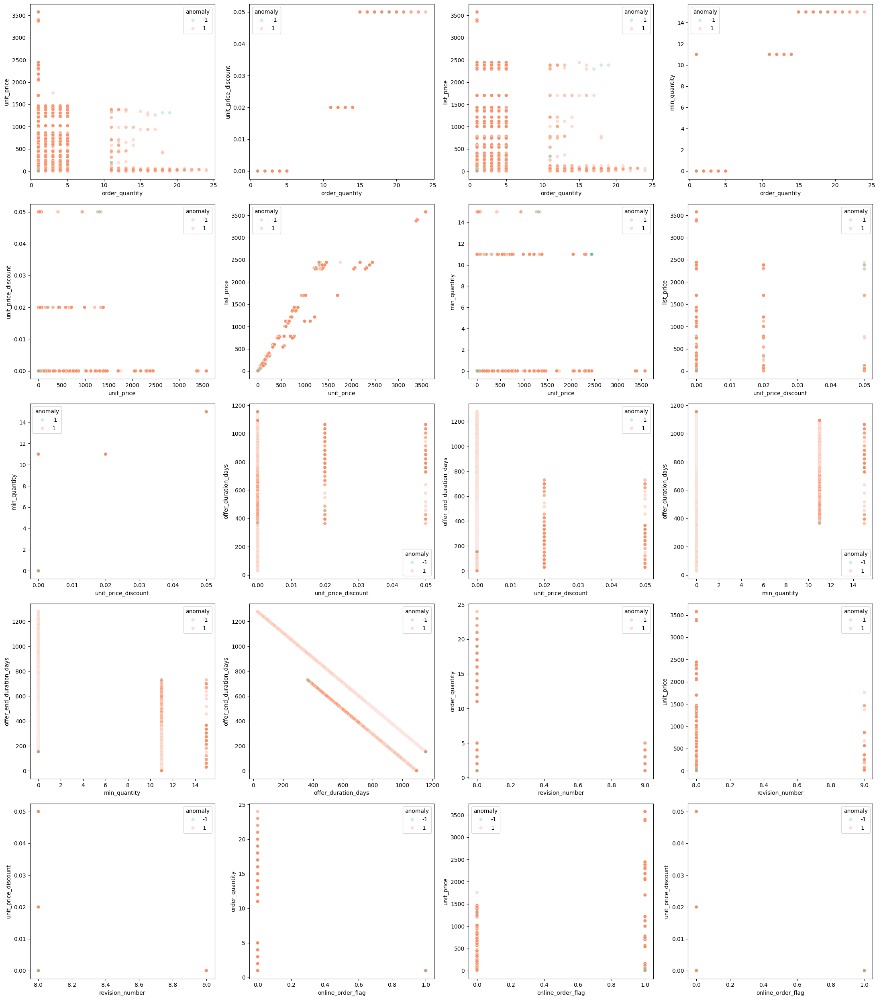

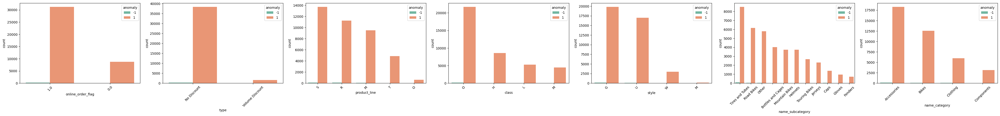

In [154]:
display_plots_for_analysis(filtered_X)

In [155]:
features_to_compare = [
    'order_quantity',
    'unit_price',
    'unit_price_discount',
    'min_quantity',
    'list_price',
    'offer_duration_days',
    'offer_end_duration_days'
]

summary = filtered_X.groupby('anomaly')[features_to_compare].agg(['mean', 'median', 'min', 'max'])
summary.T

anomaly                                  -1            1
order_quantity          mean       1.510040     1.454851
                        median     1.000000     1.000000
                        min        1.000000     1.000000
                        max       19.000000    24.000000
unit_price              mean     336.988925   538.618931
                        median    24.490000    34.990000
                        min        2.290000     1.328200
                        max     2443.350000  3578.270000
unit_price_discount     mean       0.001084     0.000334
                        median     0.000000     0.000000
                        min        0.000000     0.000000
                        max        0.050000     0.050000
min_quantity            mean       1.240964     0.451768
                        median     0.000000     0.000000
                        min        0.000000     0.000000
                        max       15.000000    15.000000
list_price              mean     358.568956   610.082141
                        median    24.490000    35.000000
                        min        2.290000     2.290000
                        max     2443.350000  3578.270000
offer_duration_days     mean     901.493976   896.002957
                        median   775.000000   935.000000
                        min      364.000000    29.000000
                        max     1155.000000  1155.000000
offer_end_duration_days mean     383.301205   403.490890
                        median   532.000000   365.000000
                        min       44.000000    -0.000000
                        max      761.000000  1279.000000

The final LOF model identified 453 anomalous transactions, representing approximately 1.08% of the dataset. LOF 4 was selected because it produced a balanced anomaly set that was small enough for business review while still identifying transactions that were locally different from similar sales records.

The root-cause analysis shows that the LOF anomalies were not caused by one single factor. Instead, they involved different combinations of order quantity, discount level, offer duration, product type, pricing behaviour, and customer/store traceability. The ID-level analysis showed that anomalies were spread across all four territories, so the issue was not isolated to one region. However, some customer/person IDs appeared only in the anomaly group, suggesting that part of the unusual behaviour may be customer- or account-specific.

Several anomaly patterns were explainable from the current data. Very high order quantities were mainly linked with volume-discount offers where the minimum quantity was also high, such as min_quantity = 25, especially for products such as Vests, Bike Racks and Shorts. This likely reflects valid bulk-purchase behaviour rather than an error. Seasonal discounts and short-duration offers were also explainable because they may reflect planned promotions, clearance activity, or short-term campaigns.

New product-related anomalies also need careful interpretation. Some new high-priced products were flagged as anomalies, especially when they also had higher order quantities. However, these should not automatically be treated as business problems. New products often have limited historical sales records, different launch pricing, and fewer comparable transactions, so LOF may flag them as locally unusual even when they are valid business activity.

Some anomalies could not be fully explained using the current dataset. High order quantities with zero minimum quantity were mostly linked with short offer durations, but the data does not show whether these offers were intentionally designed or incorrectly configured. Similarly, transactions with order quantities between 6 and 10 were anomalous mainly because they involved higher unit prices and list prices, not because of discounts. These may represent medium-volume purchases of expensive products, but the exact cause cannot be confirmed from the available variables alone.

High-discount anomalies of around 30% and 40% were business-critical. Some may be valid if linked to discontinued products or clearance activity, but the current data cannot confirm why excess inventory occurred. The dataset does not contain stock-on-hand history, demand forecasts, inventory ageing, campaign objectives, or discount approval information. Therefore, the analysis can identify that these discounts are unusual, but it cannot confirm whether they were caused by overstocking, weak demand forecasting, slow-moving products, or planned lifecycle management.

After the main explainable groups were removed, the remaining anomalies appeared to be more associated with lower-priced products rather than extreme discounts or high quantities. However, no stronger conclusion can be made using the current dataset, because the data does not include pricing-rule history, customer contracts, sales-channel details, promotion setup notes, manual approval records, or inventory context. Without these fields, further statistical slicing of the same data would only describe the anomalies again, rather than confirm their true business cause.

Overall, the LOF model is useful as a decision-support tool rather than an automatic error-detection system. It highlights unusual sales behaviour, but not every anomaly is a problem. Some anomalies are explainable using the available fields, while others have reached the limit of what can be concluded from the current dataset. To confirm the unresolved root causes, the business would need additional information such as promotion setup details, inventory history, customer segmentation, store strategy, sales-channel data, and pricing approval records.

#### J.3.2 Analysis of Isolation forest

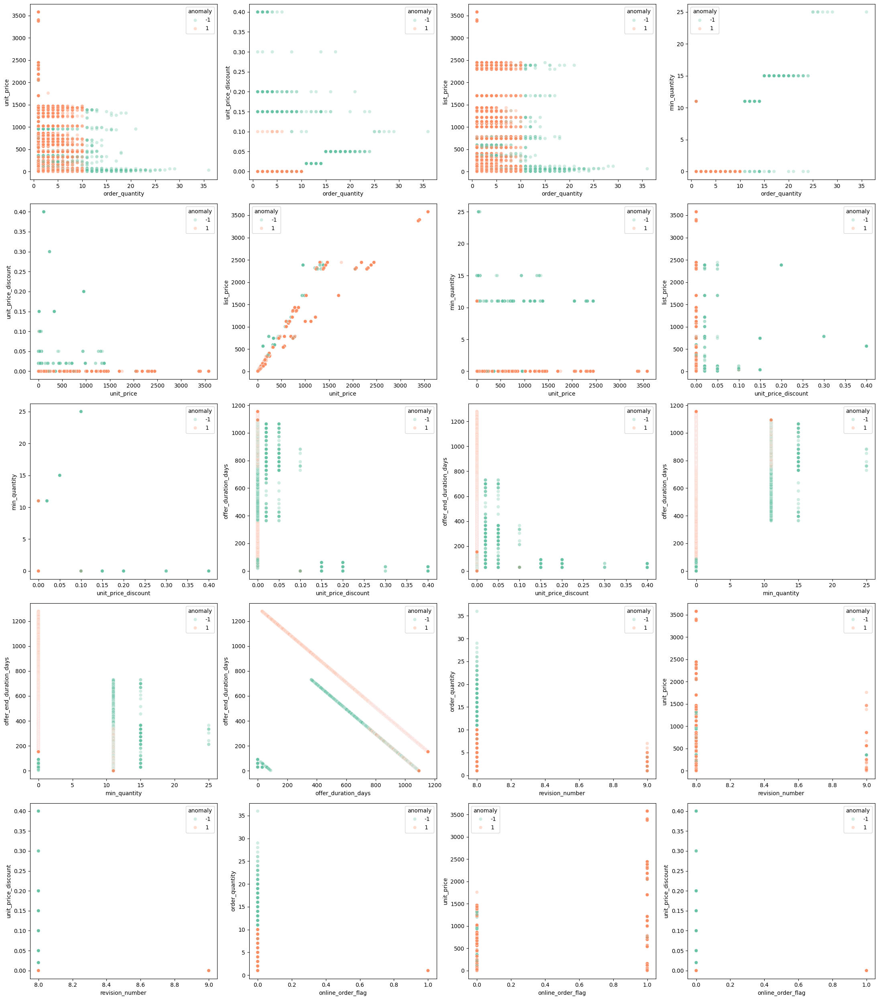

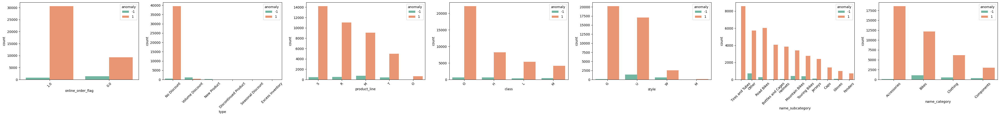

In [171]:
isf = IsolationForest(**hyperparameters_isf)
anomalies_isf = isf.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_isf))

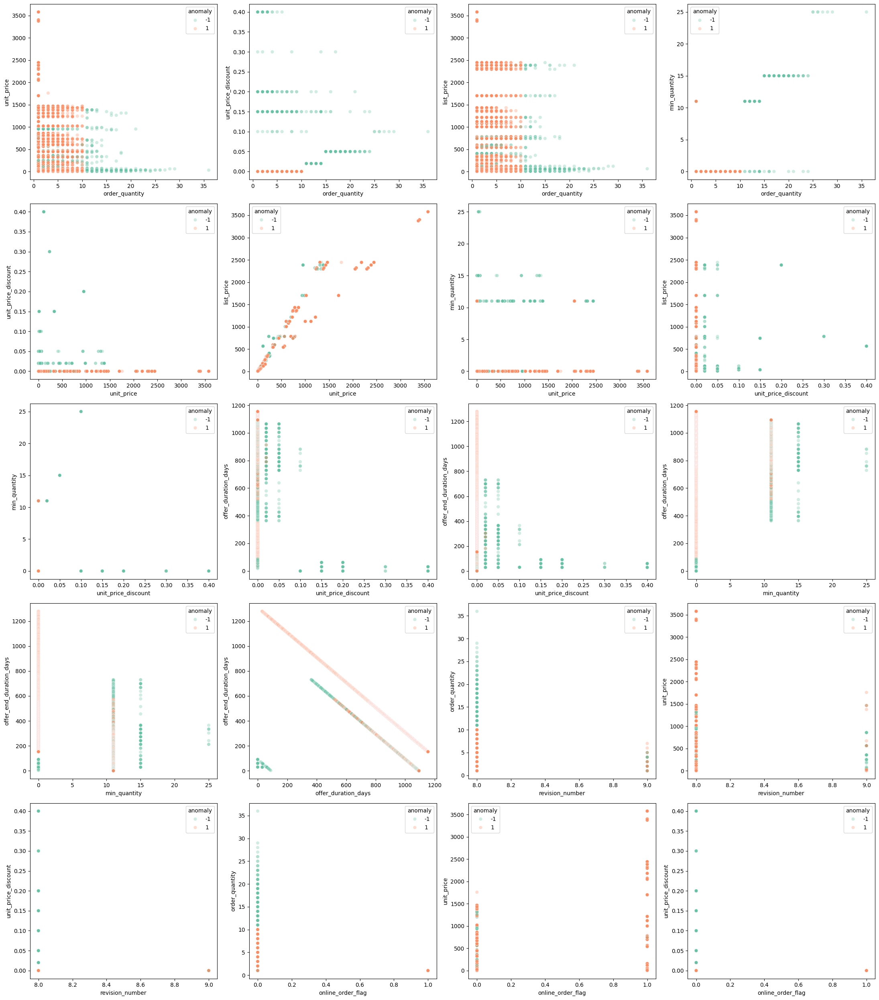

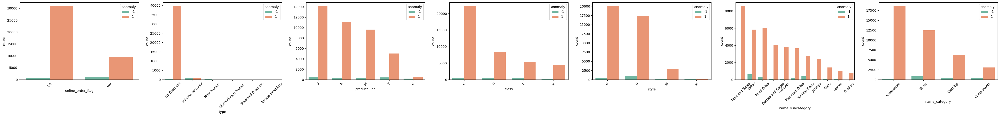

In [158]:
hyperparameters_isf1 = {
    "n_estimators": 100,
    "random_state": 42,
    "n_jobs": -1,
    "max_samples": 3000
}
isf1 = IsolationForest(**hyperparameters_isf1)
anomalies_isf1 = isf1.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_isf1))

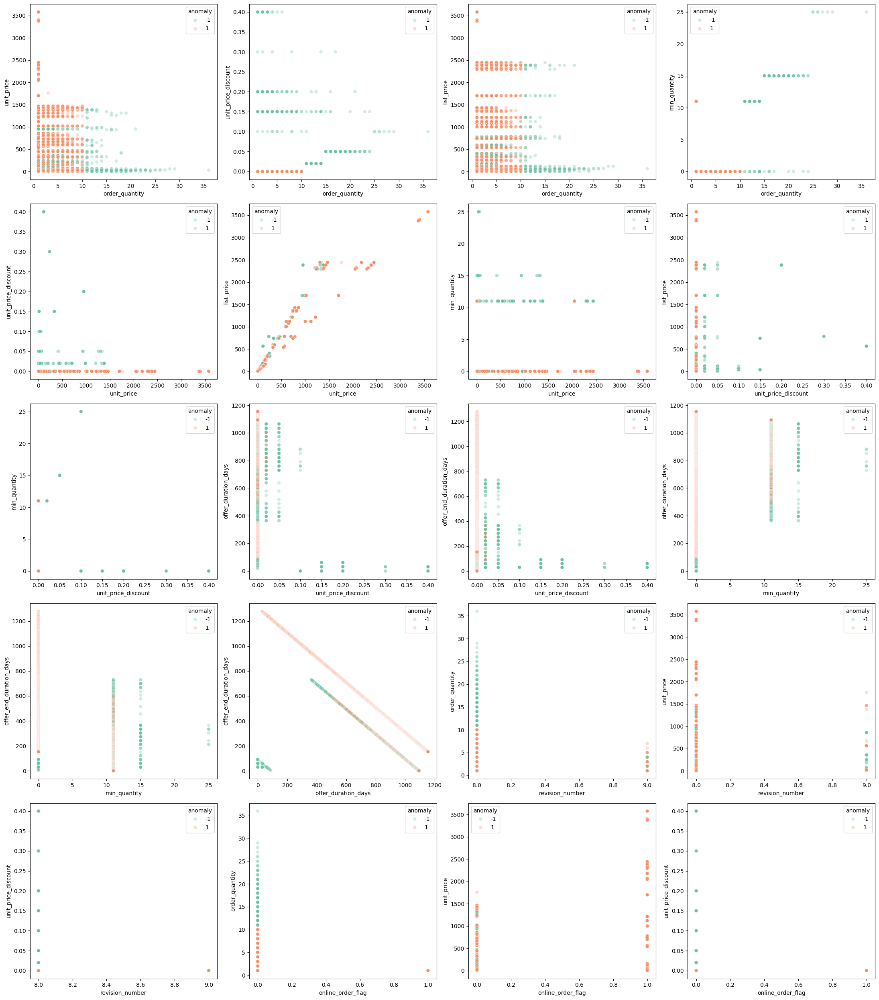

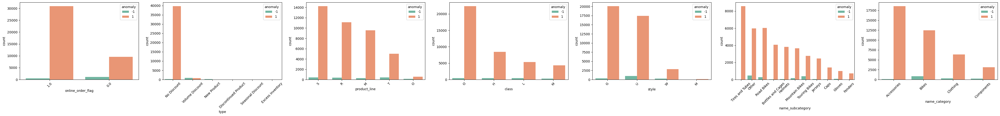

In [159]:
hyperparameters_isf2 = {
    "n_estimators": 100,
    "random_state": 42,
    "n_jobs": -1,
    "max_samples": 4000
}
isf2 = IsolationForest(**hyperparameters_isf2)
anomalies_isf2 = isf2.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_isf2))

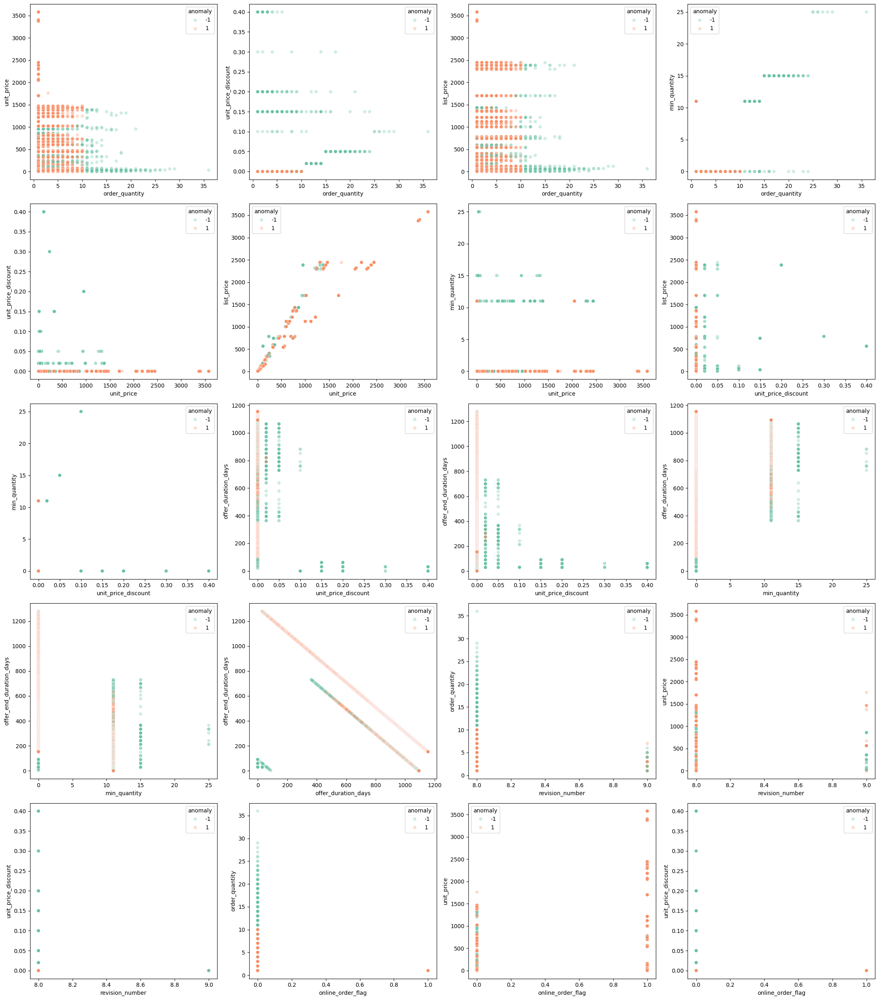

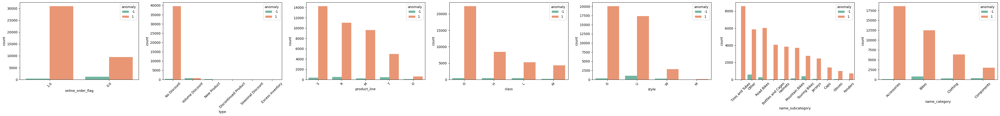

In [160]:
hyperparameters_isf3 = {
    "n_estimators": 100,
    "random_state": 42,
    "n_jobs": -1,
    "max_samples": 4000,
    "max_features": 0.8
}
isf3 = IsolationForest(**hyperparameters_isf3)
anomalies_isf3 = isf3.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_isf3))

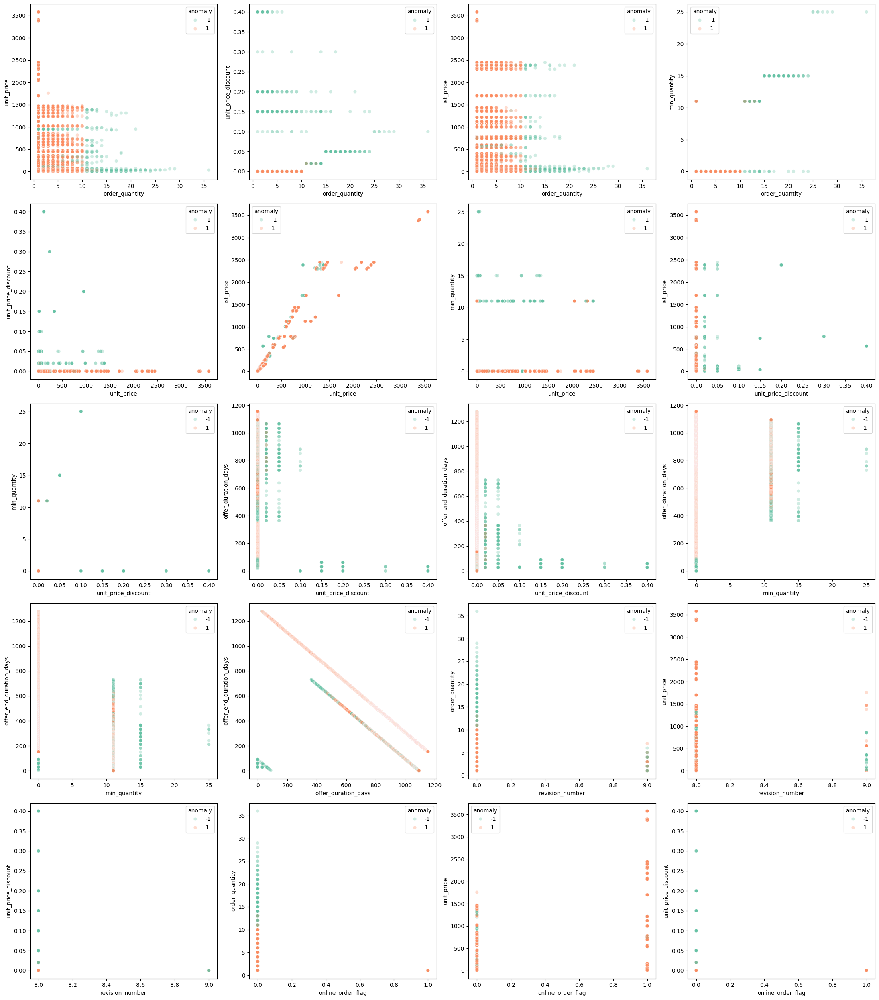

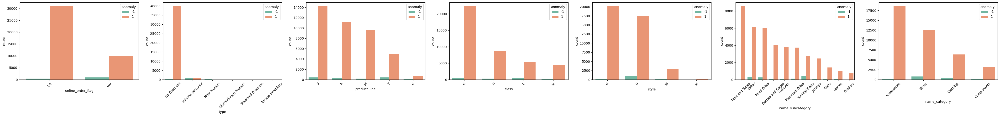

In [161]:
hyperparameters_isf4 = {
    "n_estimators": 500,
    "random_state": 42,
    "n_jobs": -1,
    "max_samples": 3000,
    "max_features": 0.8
}
isf4 = IsolationForest(**hyperparameters_isf4)
anomalies_isf4 = isf4.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_isf4))

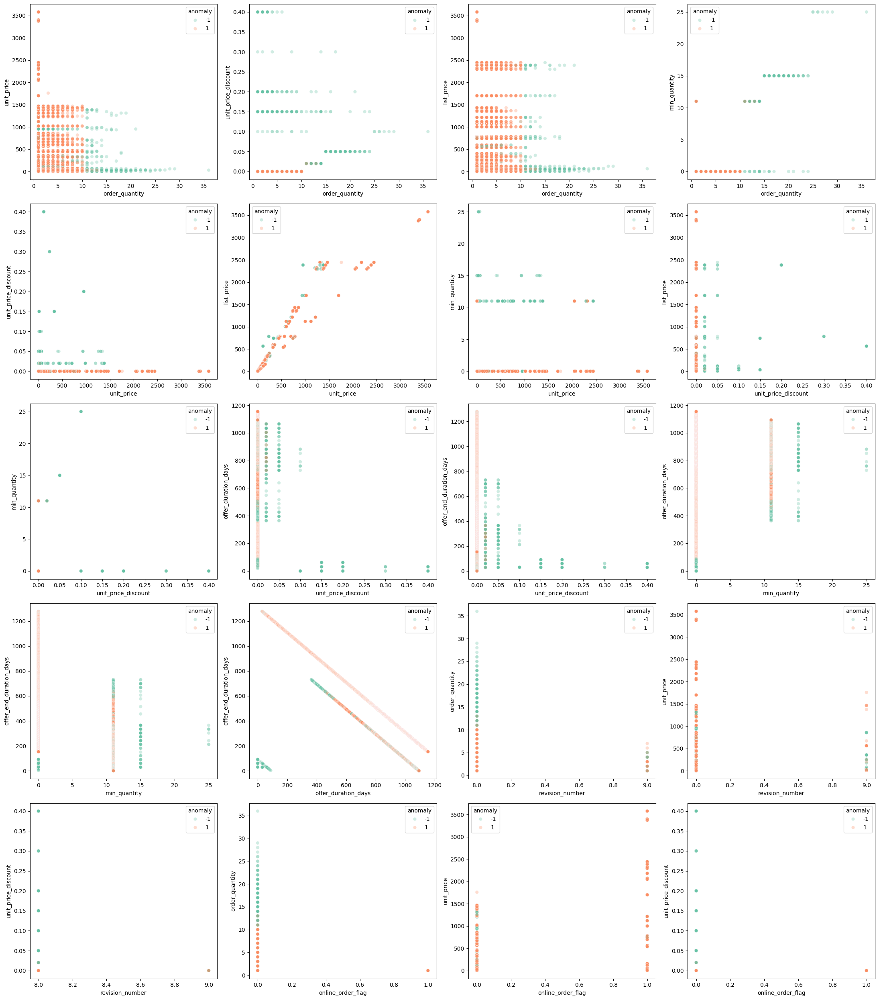

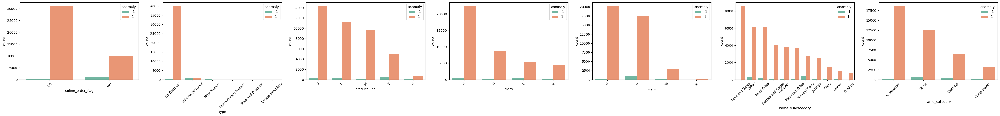

In [162]:
hyperparameters_isf5 = {
    "n_estimators": 1000,
    "random_state": 42,
    "n_jobs": -1,
    "max_samples": 3500,
    "max_features": 0.8
}
isf5 = IsolationForest(**hyperparameters_isf5)
anomalies_isf5 = isf5.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_isf5))

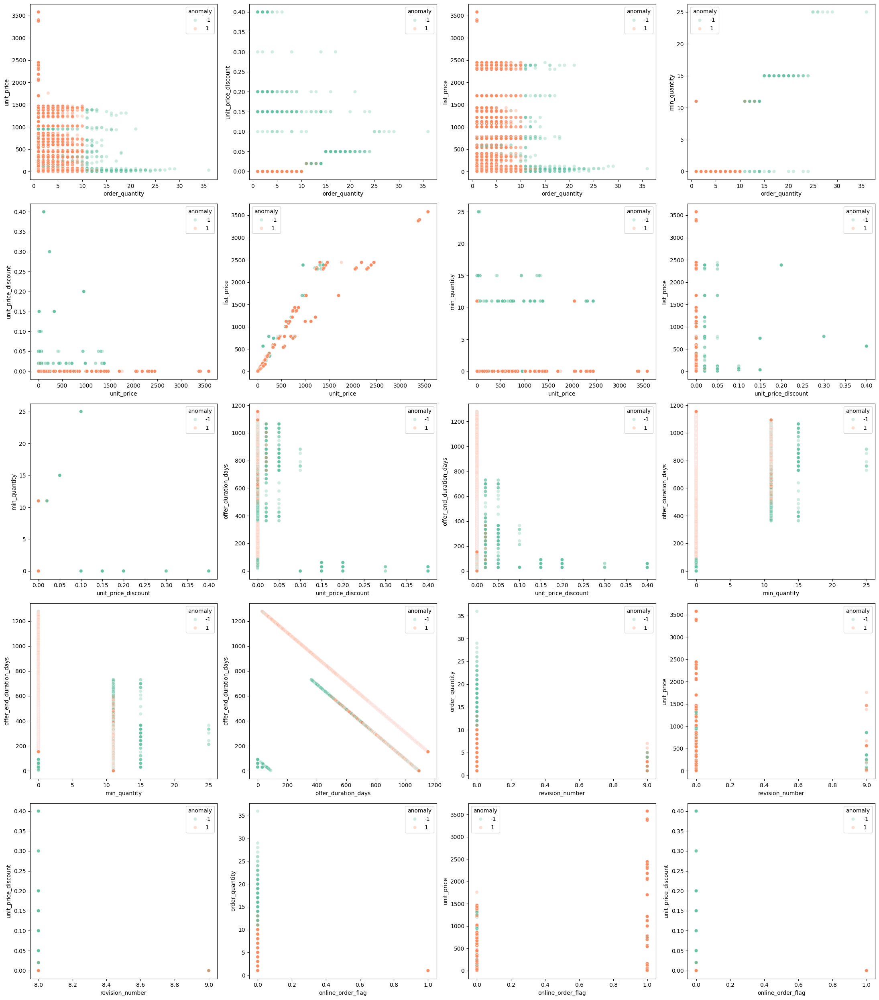

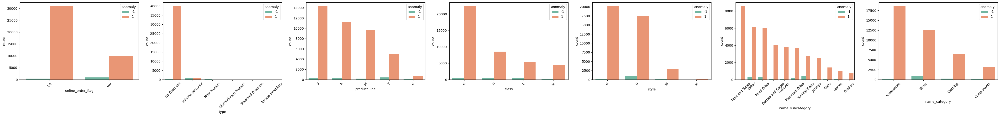

In [163]:
hyperparameters_isf6 = {
    "n_estimators": 1000,
    "random_state": 42,
    "n_jobs": -1,
    "max_samples": 3500,
    "max_features": 0.9
}
isf6 = IsolationForest(**hyperparameters_isf6)
anomalies_isf6 = isf6.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_isf6))

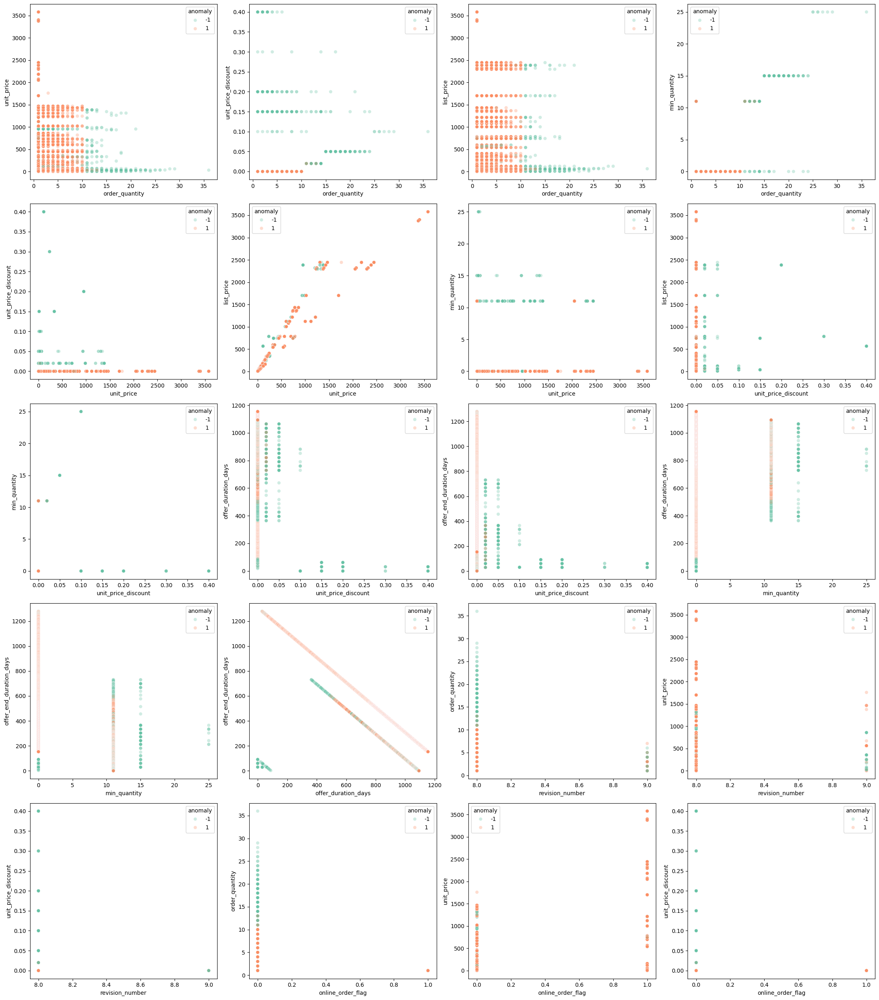

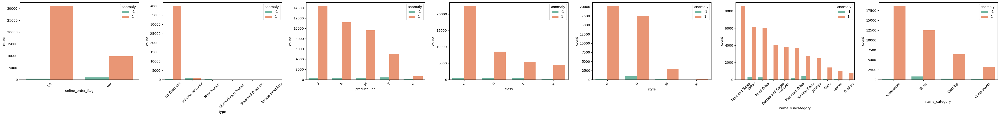

In [164]:
hyperparameters_isf7 = {
    "n_estimators": 1000,
    "random_state": 42,
    "n_jobs": -1,
    "max_samples": 4000,
    "max_features": 0.9
}
isf7 = IsolationForest(**hyperparameters_isf7)
anomalies_isf7 = isf7.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_isf7))

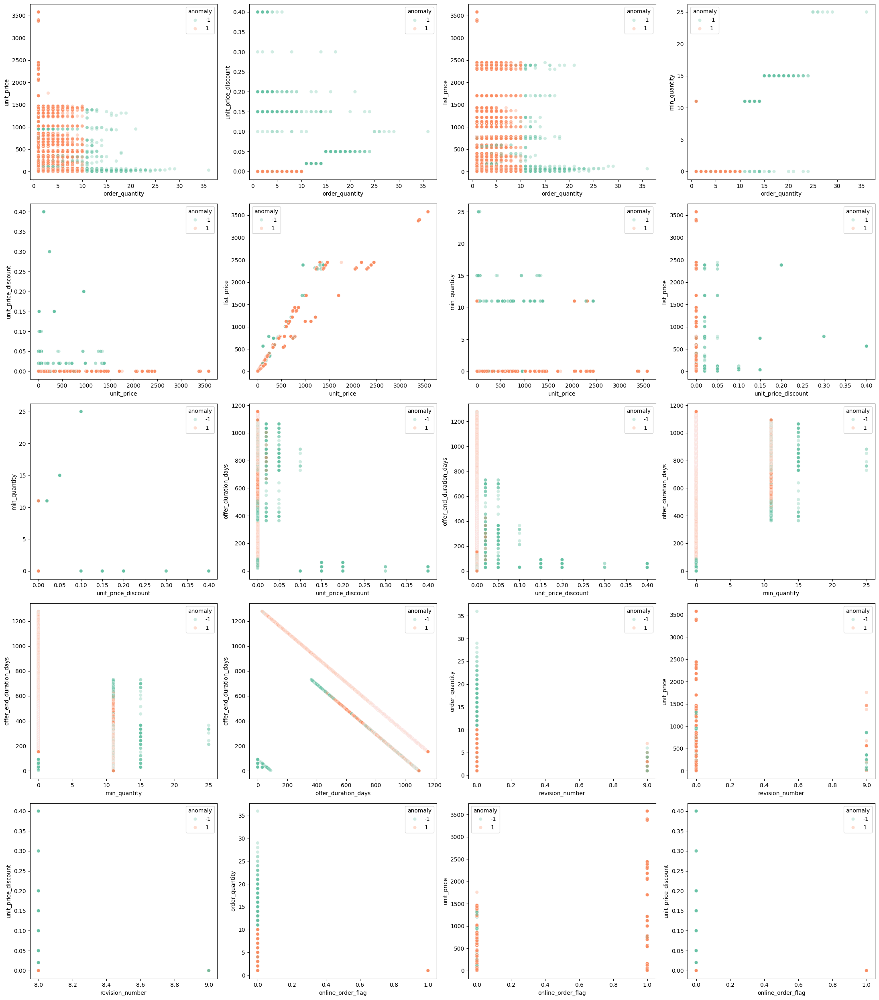

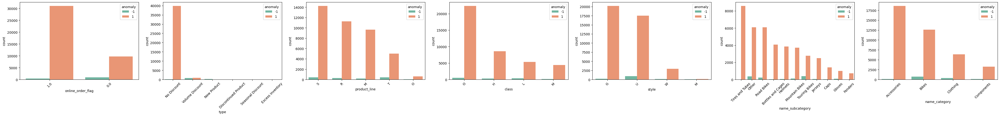

In [165]:
hyperparameters_isf8 = {
    "n_estimators": 1000,
    "random_state": 42,
    "n_jobs": -1,
    "max_samples": 4200,
    "max_features": 0.8
}
isf8 = IsolationForest(**hyperparameters_isf8)
anomalies_isf8 = isf8.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_isf8))

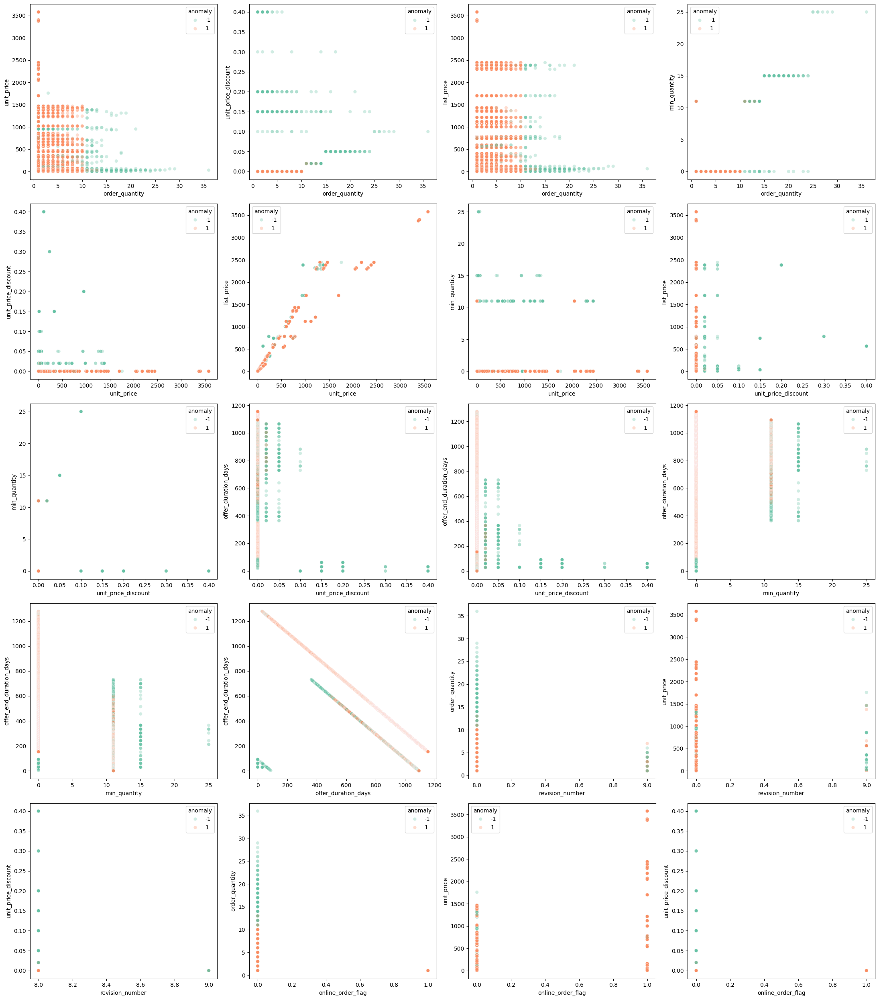

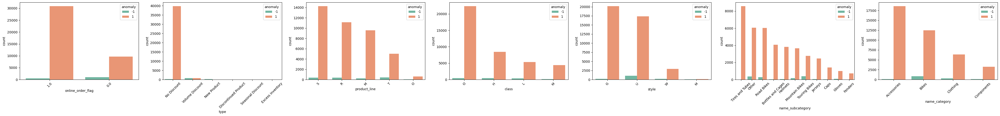

In [166]:
hyperparameters_isf9 = {
    "n_estimators": 1000,
    "random_state": 42,
    "n_jobs": -1,
    "max_samples": 4200,
    "max_features": 0.9
}
isf9 = IsolationForest(**hyperparameters_isf9)
anomalies_isf9 = isf9.fit_predict(X_train)
display_plots_for_analysis(prepare_x_for_analysis(anomalies_isf9))

In [167]:
print((anomalies_isf1 == -1).sum())
print((anomalies_isf2 == -1).sum())
print((anomalies_isf3 == -1).sum())
print((anomalies_isf4 == -1).sum())
print((anomalies_isf5 == -1).sum())
print((anomalies_isf6 == -1).sum())
print((anomalies_isf7 == -1).sum())
print((anomalies_isf8 == -1).sum())
print((anomalies_isf9 == -1).sum())

1732
1588
1626
1353
1229
1325
1302
1328
1459


Isolation Forest mainly identified discount-based anomalies and did not capture other meaningful abnormal patterns such as unusual quantities, price gaps, or product/customer-level behaviour. Since it focuses on global abnormalities, this suggests there are no strong global outliers beyond discount-related transactions. Additionaly it identifies more anomolies compared to LOF resulting more manual investigation work. Therefore, LOF should be preferred for investigation, as it captures more useful local anomalies within similar transaction groups.

### J.4 Model Technical Performance

> Provide some explanations on model performance


In [168]:
X = prepare_x_for_analysis(anomalies_lof4)
X['lof_score'] = lof4.negative_outlier_factor_
X['lof_score_positive'] = -lof4.negative_outlier_factor_

In [169]:
X.groupby('anomaly')[['lof_score', 'lof_score_positive']].agg(
    ['count', 'mean', 'median', 'min', 'max']
)

lof_score                                          lof_score_positive  \
            count      mean    median        min       max              count   
anomaly                                                                         
-1            453 -2.411540 -1.762801 -12.275370 -1.500092                453   
 1          41647 -1.028801 -1.005698  -1.498591 -0.891068              41647   

                                                  
             mean    median       min        max  
anomaly                                           
-1       2.411540  1.762801  1.500092  12.275370  
 1       1.028801  1.005698  0.891068   1.498591

In [170]:
# <Student to fill this section>
model_performance_explanations = """
The LOF model performance was evaluated using the LOF score, anomaly count and score separation between normal and anomalous transactions. The LOF score
measures how unusual a transaction is compared with its nearest neighbours, where a score close to 1 indicates normal local behaviour and a higher positive
score indicates stronger abnormality. In this model, normal transactions have an average positive LOF score of 1.03, while anomalous transactions have a
much higher average score of 2.41, showing clear separation between the two groups. The model identified 453 anomalies out of 42,100 transactions, giving
an anomaly rate of approximately 1.08%, which is small enough to be manageable for business investigation. The most extreme anomaly has a positive LOF
score of 12.28, indicating that some flagged records are highly different from their local transaction patterns. Overall, the model performs well because
it avoids over-flagging while still identifying a focused group of transactions with strong abnormal behaviour.
"""

In [242]:
# Do not modify this code
print_tile(size="h3", key='model_performance_explanations', value=model_performance_explanations)

### J.5 Business Impact from Current Model Performance

> Provide some analysis on the model impacts from the business point of view


In [175]:
# <Student to fill this section>
business_impacts_explanations = """
The LOF results support the business objective by helping the retailer prioritise unusual sales transactions that may affect revenue, margin, inventory
management and promotion control. The model identified a small and manageable anomaly group, so the business can focus on the most unusual transactions
instead of manually reviewing the full dataset.

The highest business impact comes from high-discount anomalies, especially discounts around 30% and 40%. If these discounts are valid clearance or
discontinued-product sales, they may support stock reduction. However, if they are incorrectly applied, they could cause margin leakage and unnecessary
revenue loss. Missing these cases would have a high business cost because repeated uncontrolled discounting can directly reduce profitability.

Quantity-related anomalies also have a business impact. Very high quantities linked with high minimum-quantity rules are likely expected bulk sales and
should not be treated as serious issues. However, high quantities with zero minimum quantity may indicate customers taking advantage of short-term offers
or possible weaknesses in promotion design. If these cases are missed, the business may fail to detect promotion misuse, unusually large customer orders,
or poorly configured offer rules.

Some anomalies, such as seasonal discounts, short-duration campaigns and new high-priced product sales, have lower negative impact because they are likely
valid business activity.

Overall, the LOF model should be used as a decision-support tool, not an automatic error-detection system. False negatives in high-discount or unusual
quantity cases may lead to margin leakage, poor promotion control and missed inventory issues. False positives in seasonal, new-product or planned campaign
transactions mainly increase review workload. Therefore, the most valuable business use of the model is to prioritise high-risk anomalies first, especially
discount, inventory-clearance, promotion-rule and unusual-quantity cases.
"""

In [176]:
# Do not modify this code
print_tile(size="h3", key='business_impacts_explanations', value=business_impacts_explanations)

## H. Project Outcomes

In [301]:
# <Student to fill this section>
experiment_outcome = "Hypothesis Confirmed"

In [302]:
# Do not modify this code
print_tile(size="h2", key='experiment_outcomes_explanations', value=experiment_outcome)

In [179]:
experiment_results_explanations = """
The experiment outcome shows that the LOF-based anomaly detection approach is useful and should be pursued further rather than treated as a dead end. The
selected LOF model identified 453 anomalous transactions, representing approximately 1.08% of the dataset. This is a practical outcome because the anomaly
group is small enough for business review while still capturing meaningful unusual sales behaviour. The main insight from the experiment is that anomalies
were not caused by one factor alone. They were linked to combinations of order quantity, discount level, minimum quantity rules, offer duration, product
type and customer-level behaviour. High order quantities were mostly connected to volume-discount rules, suggesting that many may be valid bulk purchases
rather than errors. However, high-discount anomalies are more business-critical because they may indicate discontinued products, excess-inventory clearance
or possible margin leakage. Seasonal discount and new-product anomalies appear more explainable, but still need monitoring.

The next experiments should focus on business validation, anomaly prioritisation, model stability testing, and adding operational data. Business validation
has the highest expected uplift because it will confirm which anomaly types are genuinely useful and reduce false positives. Anomaly prioritisation will
also uplift because it can separate high-risk discount or quantity anomalies from lower-risk seasonal or new-product cases. Stability testing across time,
product categories, customers, stores and territories checks whether the model is reliable beyond one dataset. Adding inventory, promotion, approval,
channel and customer-segment data will provide further long-term uplift.

Since the experiment achieved the required business outcome, the solution can be deployed as a decision-support tool rather than an automatic fraud or
error detector. Before production use, the preprocessing stage should be strengthened to filter or separately label explainable business events, such as
seasonal discounts, new-product promotions and planned clearance sales, so these do not create unnecessary false positives. After this, the final LOF
configuration can be used to score new transactions regularly and produce a ranked list of records for business review. Reviewer feedback should also be
collected over time to refine the filtering rules, monitor false positives and check whether the anomaly rate remains stable.
"""

In [180]:
# Do not modify this code
print_tile(size="h2", key='experiment_results_explanations', value=experiment_results_explanations)